In [16]:
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

/kaggle/input/captcha-data/data/val/ebcbx.png
/kaggle/input/captcha-data/data/val/g247w.png
/kaggle/input/captcha-data/data/val/x362g.png
/kaggle/input/captcha-data/data/val/c4bgd.png
/kaggle/input/captcha-data/data/val/m6n4x.png
/kaggle/input/captcha-data/data/val/7bwm2.png
/kaggle/input/captcha-data/data/val/5mgn4.png
/kaggle/input/captcha-data/data/val/44ype.png
/kaggle/input/captcha-data/data/val/g842c.png
/kaggle/input/captcha-data/data/val/pw5nc.png
/kaggle/input/captcha-data/data/val/ycmcw.png
/kaggle/input/captcha-data/data/val/5xwcg.png
/kaggle/input/captcha-data/data/val/dpbyd.png
/kaggle/input/captcha-data/data/val/fg38b.png
/kaggle/input/captcha-data/data/val/px8n8.png
/kaggle/input/captcha-data/data/val/nb267.png
/kaggle/input/captcha-data/data/val/yg5bb.png
/kaggle/input/captcha-data/data/val/5nm6d.png
/kaggle/input/captcha-data/data/val/d2nbn.png
/kaggle/input/captcha-data/data/val/8d2nd.png
/kaggle/input/captcha-data/data/val/dbfen.png
/kaggle/input/captcha-data/data/va

In [17]:
import numpy as np 
%matplotlib inline 
import matplotlib.pyplot as plt # to plot accuracy graphs
from keras import layers #for building layers of neural net
from keras.models import Model
from keras.models import load_model
from keras import callbacks #for training logs, saving to disk periodically
import cv2 #OpenCV(Open Source computer vision lib), containg CV algos
import string

In [18]:
os.listdir("/kaggle/input/captcha-data/data/train")

['6n6gg.png',
 'fncnb.png',
 'nxf2c.jpg',
 'nbwnn.png',
 'nxn4f.png',
 '2en7g.png',
 'y866y.png',
 'xcmbp.png',
 '56ncx.png',
 'n8wxm.jpg',
 '6ng6n.png',
 'e6m6p.png',
 'bf52c.png',
 'm2nf4.png',
 'e8e5e.png',
 'ncw4g.png',
 'x6b5m.png',
 'c4mcm.png',
 'yx2d4.png',
 'yw8y5.jpg',
 '6e6pn.png',
 '7pn5g.png',
 '243mm.png',
 'gw468.png',
 'b4ndb.jpg',
 '66wp5.png',
 'ncyx8.png',
 'cpc8c.png',
 'e72cd.png',
 'edwny.png',
 'nc4yg.png',
 'wnpec.png',
 'cd4eg.png',
 'gng6e.png',
 'md344.png',
 'wf684.png',
 '33n73.png',
 'eppg3.png',
 'n6f4b.png',
 '6wnyc.png',
 '2356g.png',
 'be3bp.png',
 'e76n4.png',
 '5xd2e.png',
 'mn5c4.png',
 'ffnxn.png',
 'b2nen.png',
 'mdxpn.png',
 'nm248.png',
 '325fb.png',
 'pwmbn.png',
 'dmx8p.png',
 '5mcy7.png',
 'dn5df.png',
 '6825y.png',
 'mnef5.png',
 '3nfdn.png',
 'y2436.png',
 '37ep6.png',
 '8ypdn.png',
 'f364x.png',
 'xemyg.png',
 '3ebnn.png',
 'ndg2b.png',
 '6mn8n.png',
 'xyncc.png',
 'mp7wp.png',
 '6xen4.png',
 '7mgmf.png',
 '3n2b4.png',
 'pme86.png',
 'nnn5

In [19]:
#total no of images in dataset
n=len(os.listdir("/kaggle/input/captcha-data/data/train"))
n

856

In [20]:
#defining size of image
imgshape=(50,200,1) #50-height, 200-width, 1-no of channels

In [21]:
character= string.ascii_lowercase + "0123456789" # All symbols captcha can contain i.e. lowercase and digits 0-9
nchar = len(character) #total number of char possible
nchar

36

In [44]:
character

'abcdefghijklmnopqrstuvwxyz0123456789'

In [22]:
#preprocesss image
def preprocess():
  X = np.zeros((n,50,200,1)) #856*50*200 array with all entries 0
  y = np.zeros((5,n,nchar)) #5*856*36(5 letters in captcha) with all entries 0

  for i, pic in enumerate(os.listdir("/kaggle/input/captcha-data/data/train")):
  #i represents index no. of image in directory 
  #pic contains the file name of the particular image to be preprocessed at a time
    img = cv2.imread(os.path.join("/kaggle/input/captcha-data/data/train", pic), cv2.IMREAD_GRAYSCALE) #Read image in grayscale format
    pic_target = pic[:-4]#this drops the .png extension from file name and contains only the captcha for training
    
    if len(pic_target) < 6: #captcha is not more than 5 letters
      img = img / 255.0 #scales the image between 0 and 1
      img = np.reshape(img, (50, 200, 1)) #reshapes image to width 200 , height 50 ,channel 1 

      target=np.zeros((5,nchar)) #creates an array of size 5*36 with all entries 0

      for j, k in enumerate(pic_target):
      #j iterates from 0 to 4(There are 5 letters in captcha and indexing is 0 based)
      #k denotes the letter in captcha which is to be scanned
         index = character.find(k) #index stores the position of letter k of captcha in the character string
         target[j, index] = 1 #replaces 0 with 1 in the target array at the position of the letter in captcha

      X[i] = img #stores all the images
      y[:,i] = target #stores all the info about the letters in captcha of all images

  return X,y

In [55]:
#create model
def createmodel():
    img = layers.Input(shape=imgshape) # Get image as an input of size 50,200,1
    # convolution layers
    conv1 = layers.Conv2D(filters = 16, kernel_size = (3, 3), padding='same', activation='relu')(img) #50*200
    mp1 = layers.MaxPooling2D(padding='same')(conv1)  # 25*100
    conv2 = layers.Conv2D(filters = 32, kernel_size = (3, 3), padding='same', activation='relu')(mp1)
    mp2 = layers.MaxPooling2D(padding='same')(conv2)  # 13*50
    conv3 = layers.Conv2D(filters = 32, kernel_size = (3, 3), padding='same', activation='relu')(mp2)
    bn = layers.BatchNormalization()(conv3) #to improve the stability of model
    mp3 = layers.MaxPooling2D(padding='same')(bn)  # 7*25
    
    flat = layers.Flatten()(mp3) #convert the layer into 1-D
    
    # hidden and output layers for the 5 outputs   
    outs = []
    for _ in range(5): #for 5 letters of captcha
        dens1 = layers.Dense(64, activation='relu')(flat)
        drop = layers.Dropout(0.5)(dens1) #drops 0.5 fraction of nodes
        res = layers.Dense(nchar, activation='softmax')(drop)

        outs.append(res) #result of layers
    
    # Compile model and return it
    model = Model(img, outs) #create model
    model.compile(loss='categorical_crossentropy', optimizer='adam',metrics=["accuracy"])
    return model

In [56]:
#Create model
model=createmodel();
model.summary();

Model: "model_5"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_6 (InputLayer)           [(None, 50, 200, 1)  0           []                               
                                ]                                                                 
                                                                                                  
 conv2d_15 (Conv2D)             (None, 50, 200, 16)  160         ['input_6[0][0]']                
                                                                                                  
 max_pooling2d_15 (MaxPooling2D  (None, 25, 100, 16)  0          ['conv2d_15[0][0]']              
 )                                                                                                
                                                                                            

In [57]:
X,y=preprocess()

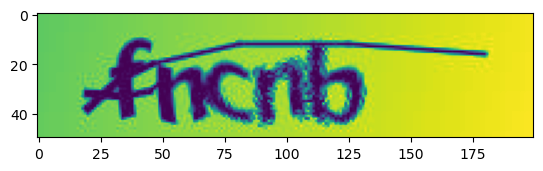

In [27]:
plt.imshow(X[1])

In [52]:
print(y[2][1]) # means that the model shall detect c as second third character in the second captcha

[0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]


In [58]:
# training data split into features and labels
X_train, y_train = X, y

In [59]:
#Applying the model
hist = model.fit(X_train, [y_train[0], y_train[1], y_train[2], y_train[3], y_train[4]], batch_size=32, epochs=60, validation_split=0.2)
#batch size- 32 defines no. of samples per gradient update
#Validation split=0.2 splits the training set in 80-20% for training nd testing

Epoch 1/60
22/22 [==============================] - 6s 140ms/step - loss: 18.0466 - dense_51_loss: 3.5888 - dense_53_loss: 3.5201 - dense_55_loss: 3.6242 - dense_57_loss: 3.6083 - dense_59_loss: 3.7052 - dense_51_accuracy: 0.0468 - dense_53_accuracy: 0.0673 - dense_55_accuracy: 0.0629 - dense_57_accuracy: 0.0497 - dense_59_accuracy: 0.0585 - val_loss: 17.6817 - val_dense_51_loss: 3.5570 - val_dense_53_loss: 3.5184 - val_dense_55_loss: 3.5301 - val_dense_57_loss: 3.5092 - val_dense_59_loss: 3.5669 - val_dense_51_accuracy: 0.0523 - val_dense_53_accuracy: 0.0523 - val_dense_55_accuracy: 0.0581 - val_dense_57_accuracy: 0.0291 - val_dense_59_accuracy: 0.1221
Epoch 2/60
22/22 [==============================] - 3s 119ms/step - loss: 17.1295 - dense_51_loss: 3.3894 - dense_53_loss: 3.3374 - dense_55_loss: 3.4455 - dense_57_loss: 3.4044 - dense_59_loss: 3.5527 - dense_51_accuracy: 0.0541 - dense_53_accuracy: 0.0921 - dense_55_accuracy: 0.0658 - dense_57_accuracy: 0.0643 - dense_59_accuracy: 0.0

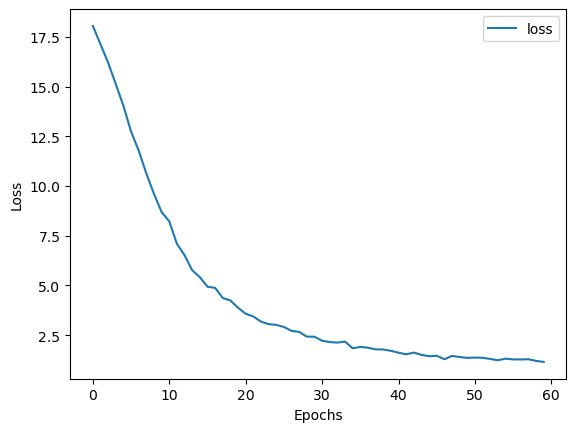

In [60]:
#graph of loss vs epochs
for label in ["loss"]:
  plt.plot(hist.history[label],label=label)
plt.legend()
plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.show()

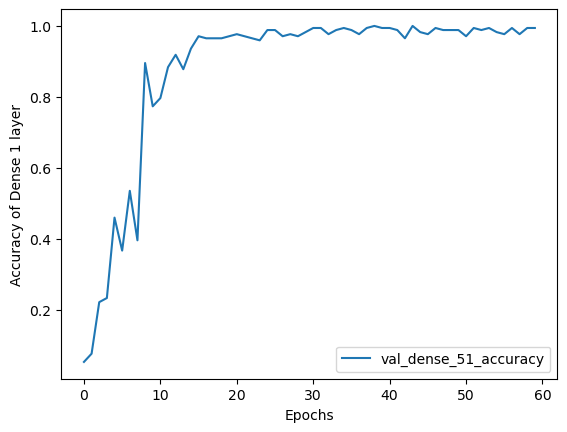

In [67]:
#graph of accuracy of dense_2 vs epochs
for label in ["val_dense_51_accuracy"]:
    plt.plot(hist.history[label],label=label)
plt.legend()
plt.xlabel("Epochs")
plt.ylabel("Accuracy of Dense 1 layer")
plt.show()

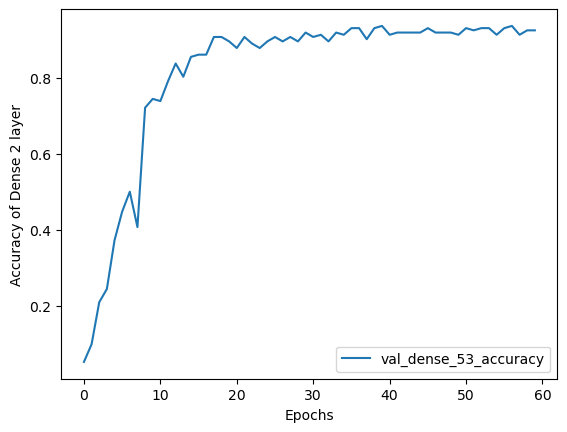

In [68]:
#graph of accuracy of dense_6 vs epochs
for label in ["val_dense_53_accuracy"]:
  plt.plot(hist.history[label],label=label)
plt.legend()
plt.xlabel("Epochs")
plt.ylabel("Accuracy of Dense 2 layer")
plt.show()

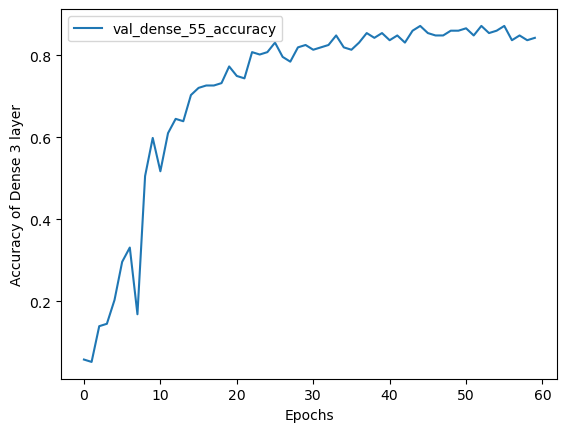

In [69]:
#graph of accuracy of dense_6 vs epochs
for label in ["val_dense_55_accuracy"]:
  plt.plot(hist.history[label],label=label)
plt.legend()
plt.xlabel("Epochs")
plt.ylabel("Accuracy of Dense 3 layer")
plt.show()

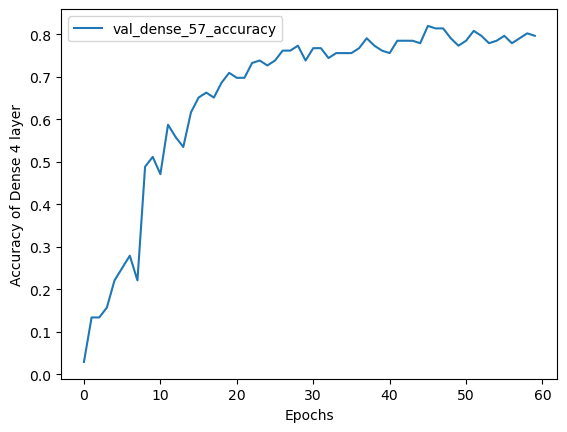

In [70]:
#graph of accuracy of dense_6 vs epochs
for label in ["val_dense_57_accuracy"]:
  plt.plot(hist.history[label],label=label)
plt.legend()
plt.xlabel("Epochs")
plt.ylabel("Accuracy of Dense 4 layer")
plt.show()

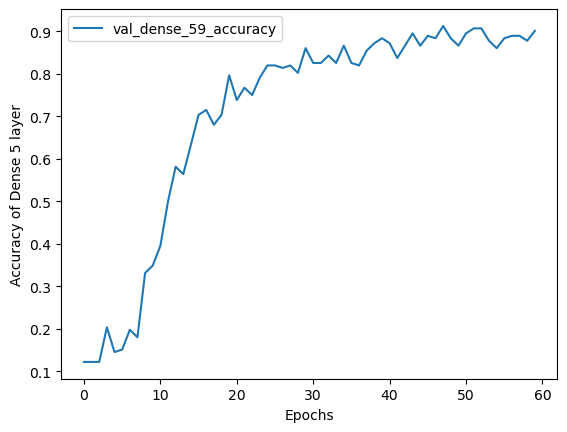

In [71]:
#graph of accuracy of dense_6 vs epochs
for label in ["val_dense_59_accuracy"]:
  plt.plot(hist.history[label],label=label)
plt.legend()
plt.xlabel("Epochs")
plt.ylabel("Accuracy of Dense 5 layer")
plt.show()

In [72]:
#Loss on training set
#Finding Loss on training set
preds = model.evaluate(X_train, [y_train[0], y_train[1], y_train[2], y_train[3], y_train[4]])
print ("Loss on training set= " + str(preds[0]))

27/27 [==============================] - 1s 29ms/step - loss: 0.6046 - dense_51_loss: 0.0037 - dense_53_loss: 0.0822 - dense_55_loss: 0.1541 - dense_57_loss: 0.2692 - dense_59_loss: 0.0954 - dense_51_accuracy: 0.9988 - dense_53_accuracy: 0.9848 - dense_55_accuracy: 0.9685 - dense_57_accuracy: 0.9591 - dense_59_accuracy: 0.9801
Loss on training set= 0.6046437621116638


In [73]:
print("No. of test images: ", len(os.listdir("/kaggle/input/captcha-data/data/val")))

No. of test images:  214


In [74]:
# Preprocessing for testing data
def preprocess_test():
  X = np.zeros((n,50,200,1)) #214*50*200 array with all entries 0
  y = np.zeros((5,n,nchar)) #5*214*36(5 letters in captcha) with all entries 0

  for i, pic in enumerate(os.listdir("/kaggle/input/captcha-data/data/val")):
  #i represents index no. of image in directory 
  #pic contains the file name of the particular image to be preprocessed at a time
    img = cv2.imread(os.path.join("/kaggle/input/captcha-data/data/val", pic), cv2.IMREAD_GRAYSCALE) #Read image in grayscale format
    pic_target = pic[:-4]#this drops the .png extension from file name and contains only the captcha for training
    
    if len(pic_target) < 6: #captcha is not more than 5 letters
      img = img / 255.0 #scales the image between 0 and 1
      img = np.reshape(img, (50, 200, 1)) #reshapes image to width 200 , height 50 ,channel 1 

      target=np.zeros((5,nchar)) #creates an array of size 5*36 with all entries 0

      for j, k in enumerate(pic_target):
      #j iterates from 0 to 4(There are 5 letters in captcha and indexing is 0 based)
      #k denotes the letter in captcha which is to be scanned
         index = character.find(k) #index stores the position of letter k of captcha in the character string
         target[j, index] = 1 #replaces 0 with 1 in the target array at the position of the letter in captcha

      X[i] = img #stores all the images
      y[:,i] = target #stores all the info about the letters in captcha of all images

  return X,y

In [75]:
X_test,y_test = preprocess_test()

In [76]:
#Finding loss on test set
preds = model.evaluate(X_test, [y_test[0], y_test[1], y_test[2], y_test[3], y_test[4]])
print ("Loss on testing set= " + str(preds[0]))

27/27 [==============================] - 1s 30ms/step - loss: 0.5392 - dense_51_loss: 0.0207 - dense_53_loss: 0.0638 - dense_55_loss: 0.1252 - dense_57_loss: 0.2072 - dense_59_loss: 0.1223 - dense_51_accuracy: 0.2453 - dense_53_accuracy: 0.2371 - dense_55_accuracy: 0.2185 - dense_57_accuracy: 0.2103 - dense_59_accuracy: 0.2185
Loss on testing set= 0.5391891598701477


In [77]:
#to predict captcha
def predict(filepath):
    img = cv2.imread(filepath, cv2.IMREAD_GRAYSCALE)

    if img is not None: #image foud at file path
        img = img / 255.0 #Scale image
    else:
        print("Not detected");

    res = np.array(model.predict(img[np.newaxis, :, :, np.newaxis])) #np.newaxis=1 
    #added this bcoz x_train 970*50*200*1
    #returns array of size 1*5*36 
    result = np.reshape(res, (5, 36)) #reshape the array
    k_ind = []
    probs = []
    for i in result:
        k_ind.append(np.argmax(i)) #adds the index of the char found in captcha

    capt = '' #string to store predicted captcha
    for k in k_ind:
        capt += character[k] #finds the char corresponding to the index
    return capt 
     

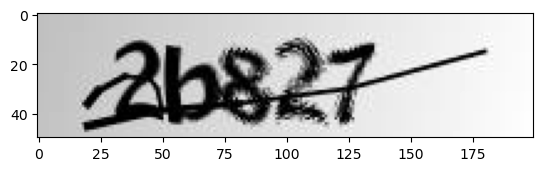

In [81]:
#Check model on samples
img=cv2.imread('/kaggle/input/captcha-data/data/sample/2b827.png',cv2.IMREAD_GRAYSCALE)
plt.imshow(img, cmap=plt.get_cmap('gray'))

In [82]:
print("Predicted Captcha =",predict('/kaggle/input/captcha-data/data/sample/2b827.png'))

1/1 [==============================] - 0s 21ms/step
Predicted Captcha = 2b827


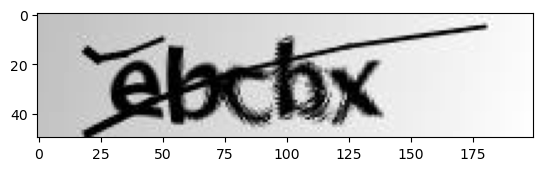

Actual Captcha: ebcbx
1/1 [==============================] - 0s 21ms/step
Predicted Captcha = ebcbx




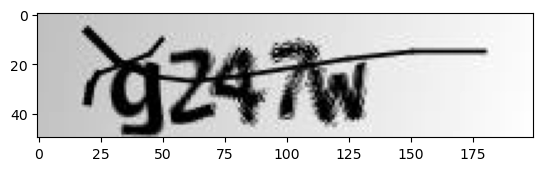

Actual Captcha: g247w
1/1 [==============================] - 0s 21ms/step
Predicted Captcha = g247w




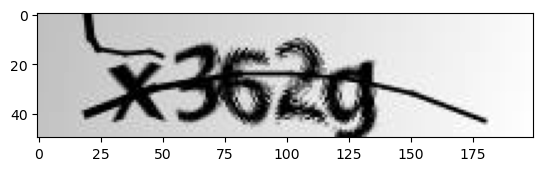

Actual Captcha: x362g
1/1 [==============================] - 0s 20ms/step
Predicted Captcha = x362g




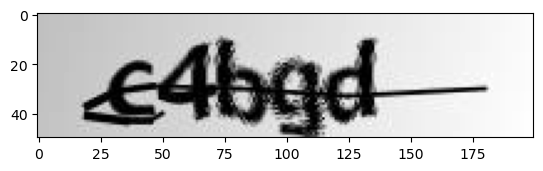

Actual Captcha: c4bgd
1/1 [==============================] - 0s 20ms/step
Predicted Captcha = c4bgd




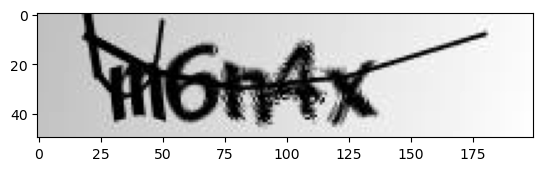

Actual Captcha: m6n4x
1/1 [==============================] - 0s 18ms/step
Predicted Captcha = m6n4x




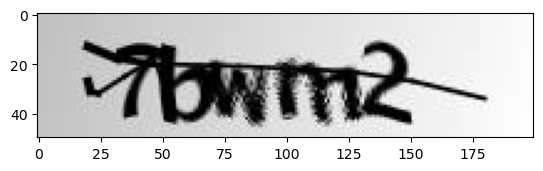

Actual Captcha: 7bwm2
1/1 [==============================] - 0s 18ms/step
Predicted Captcha = 7bwne




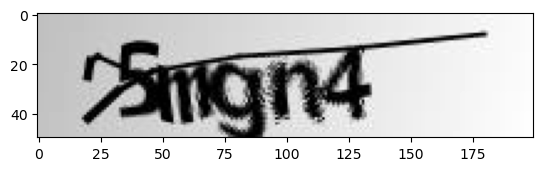

Actual Captcha: 5mgn4
1/1 [==============================] - 0s 19ms/step
Predicted Captcha = 5mgn4




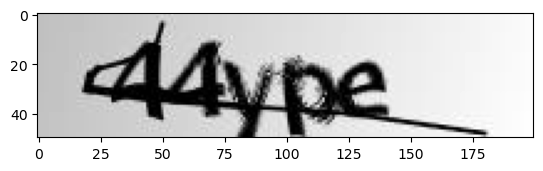

Actual Captcha: 44ype
1/1 [==============================] - 0s 20ms/step
Predicted Captcha = 44ype




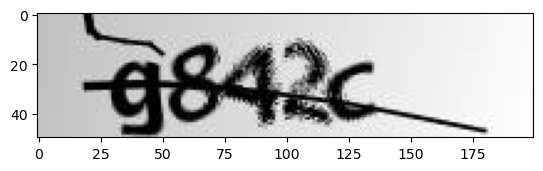

Actual Captcha: g842c
1/1 [==============================] - 0s 19ms/step
Predicted Captcha = g842c




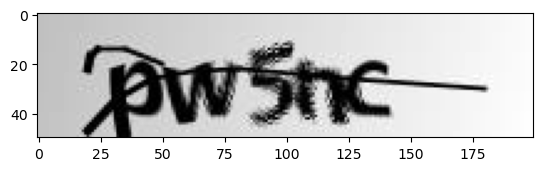

Actual Captcha: pw5nc
1/1 [==============================] - 0s 19ms/step
Predicted Captcha = pw5bc




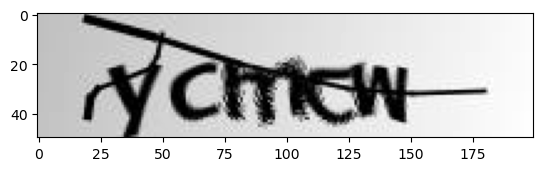

Actual Captcha: ycmcw
1/1 [==============================] - 0s 20ms/step
Predicted Captcha = ycnnw




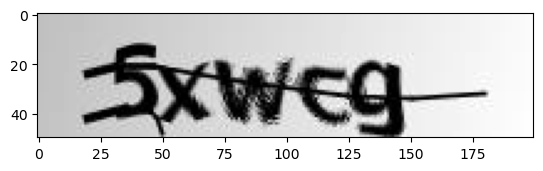

Actual Captcha: 5xwcg
1/1 [==============================] - 0s 18ms/step
Predicted Captcha = 5xw2g




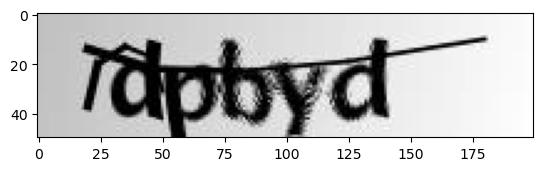

Actual Captcha: dpbyd
1/1 [==============================] - 0s 21ms/step
Predicted Captcha = dpbyd




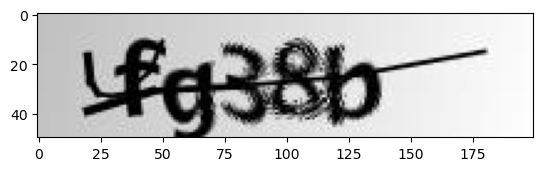

Actual Captcha: fg38b
1/1 [==============================] - 0s 20ms/step
Predicted Captcha = fg38b




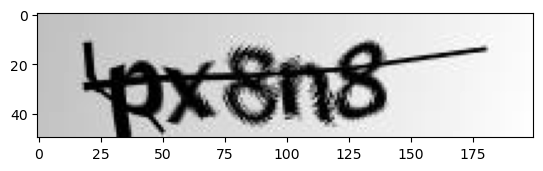

Actual Captcha: px8n8
1/1 [==============================] - 0s 18ms/step
Predicted Captcha = px8n8




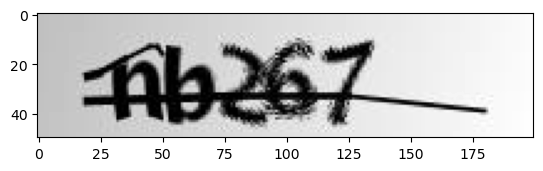

Actual Captcha: nb267
1/1 [==============================] - 0s 19ms/step
Predicted Captcha = nb267




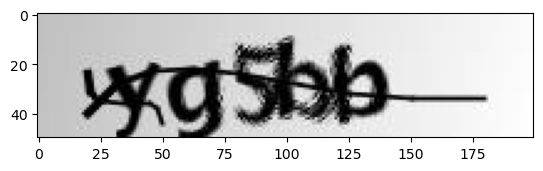

Actual Captcha: yg5bb
1/1 [==============================] - 0s 20ms/step
Predicted Captcha = yg5bb




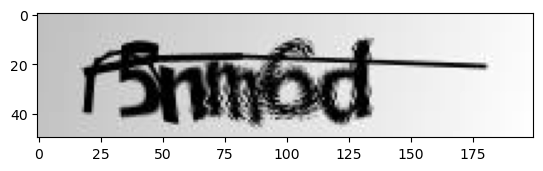

Actual Captcha: 5nm6d
1/1 [==============================] - 0s 19ms/step
Predicted Captcha = 5nm6d




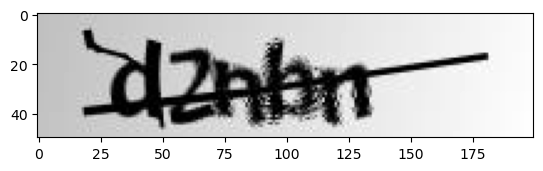

Actual Captcha: d2nbn
1/1 [==============================] - 0s 19ms/step
Predicted Captcha = d2nbn




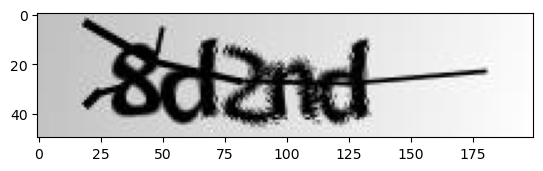

Actual Captcha: 8d2nd
1/1 [==============================] - 0s 19ms/step
Predicted Captcha = 8d2nd




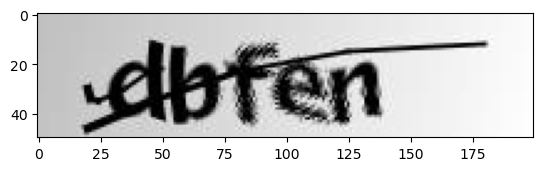

Actual Captcha: dbfen
1/1 [==============================] - 0s 19ms/step
Predicted Captcha = dbfen




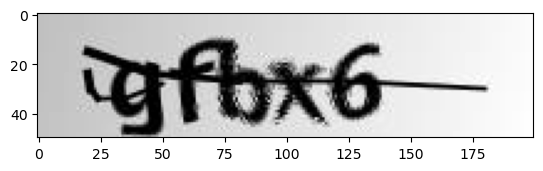

Actual Captcha: gfbx6
1/1 [==============================] - 0s 20ms/step
Predicted Captcha = gfbx6




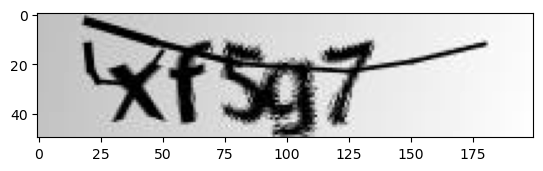

Actual Captcha: xf5g7
1/1 [==============================] - 0s 20ms/step
Predicted Captcha = xf5g7




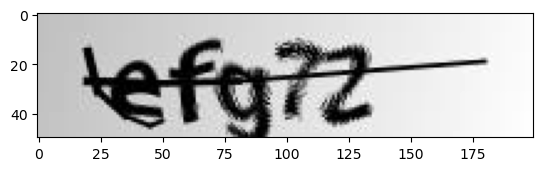

Actual Captcha: efg72
1/1 [==============================] - 0s 21ms/step
Predicted Captcha = efg72




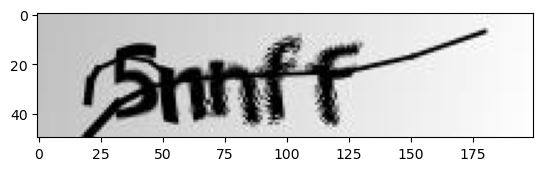

Actual Captcha: 5nnff
1/1 [==============================] - 0s 18ms/step
Predicted Captcha = 5nnff




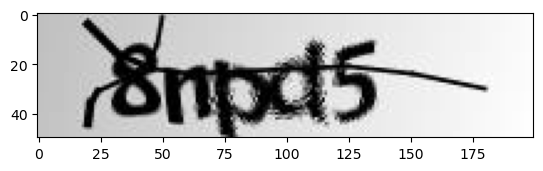

Actual Captcha: 8npd5
1/1 [==============================] - 0s 20ms/step
Predicted Captcha = 8npd5




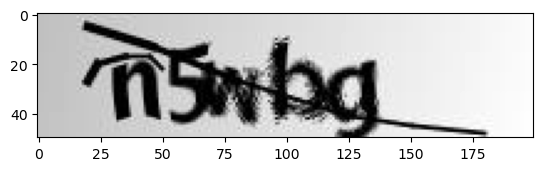

Actual Captcha: n5wbg
1/1 [==============================] - 0s 20ms/step
Predicted Captcha = n3wbg




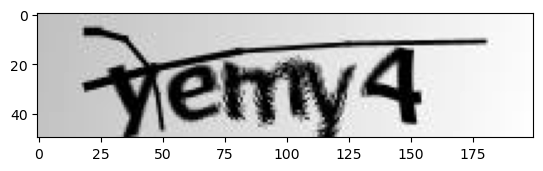

Actual Captcha: yemy4
1/1 [==============================] - 0s 21ms/step
Predicted Captcha = yenn4




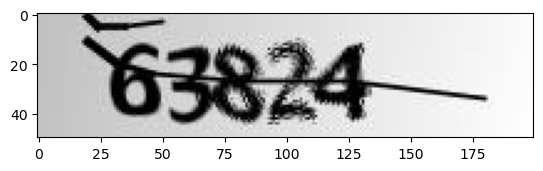

Actual Captcha: 63824
1/1 [==============================] - 0s 27ms/step
Predicted Captcha = 63824




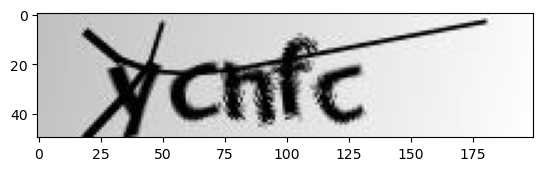

Actual Captcha: ycnfc
1/1 [==============================] - 0s 25ms/step
Predicted Captcha = ycnfc




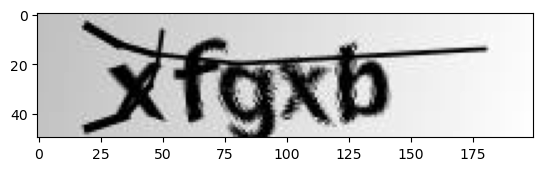

Actual Captcha: xfgxb
1/1 [==============================] - 0s 21ms/step
Predicted Captcha = xfgxb




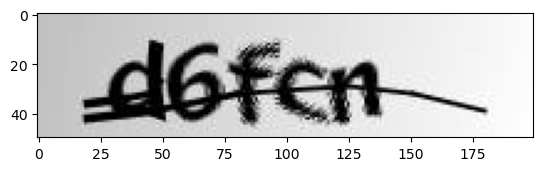

Actual Captcha: d6fcn
1/1 [==============================] - 0s 22ms/step
Predicted Captcha = d6fcn




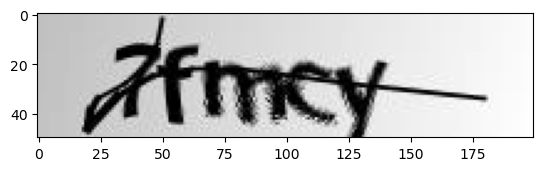

Actual Captcha: 7fmcy
1/1 [==============================] - 0s 21ms/step
Predicted Captcha = 7fney




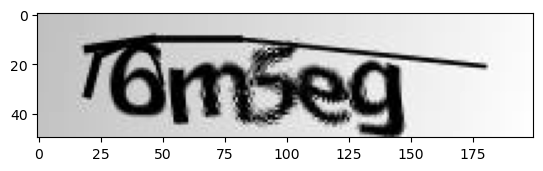

Actual Captcha: 6m5eg
1/1 [==============================] - 0s 21ms/step
Predicted Captcha = 6nfwg




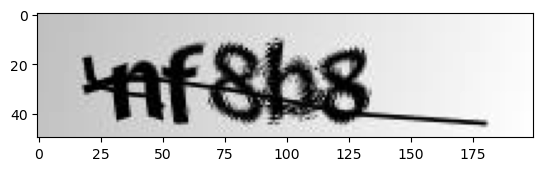

Actual Captcha: nf8b8
1/1 [==============================] - 0s 24ms/step
Predicted Captcha = nf8b8




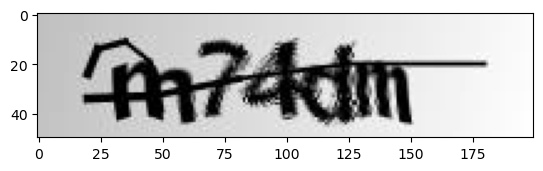

Actual Captcha: m74dm
1/1 [==============================] - 0s 20ms/step
Predicted Captcha = n73bn




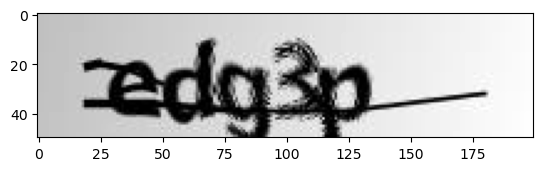

Actual Captcha: edg3p
1/1 [==============================] - 0s 23ms/step
Predicted Captcha = edg3p




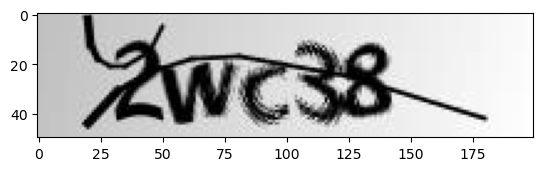

Actual Captcha: 2wc38
1/1 [==============================] - 0s 19ms/step
Predicted Captcha = 2wn58




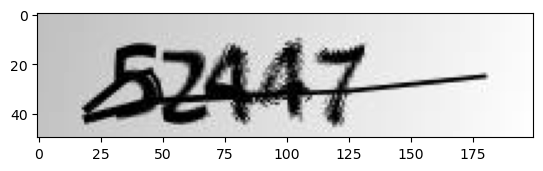

Actual Captcha: 52447
1/1 [==============================] - 0s 22ms/step
Predicted Captcha = 52467




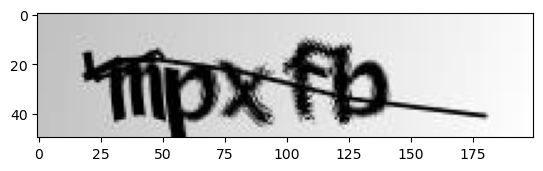

Actual Captcha: mpxfb
1/1 [==============================] - 0s 21ms/step
Predicted Captcha = mpxfb




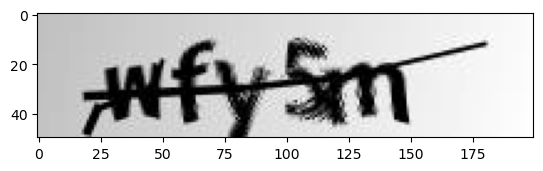

Actual Captcha: wfy5m
1/1 [==============================] - 0s 19ms/step
Predicted Captcha = wfy5m




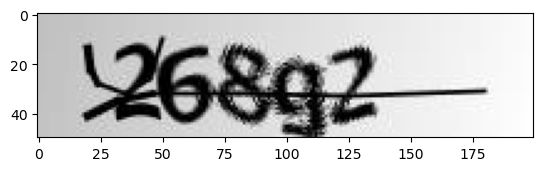

Actual Captcha: 268g2
1/1 [==============================] - 0s 19ms/step
Predicted Captcha = 268g2




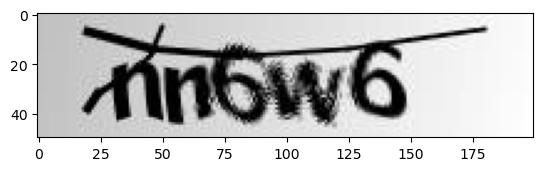

Actual Captcha: nn6w6
1/1 [==============================] - 0s 20ms/step
Predicted Captcha = nn6w5




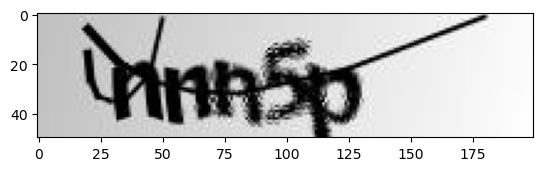

Actual Captcha: nnn5p
1/1 [==============================] - 0s 20ms/step
Predicted Captcha = nnn5n




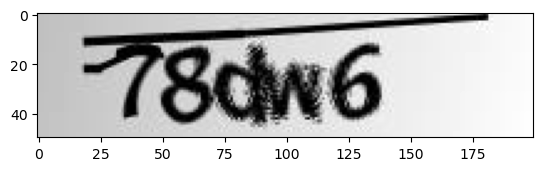

Actual Captcha: 78dw6
1/1 [==============================] - 0s 19ms/step
Predicted Captcha = 78dw6




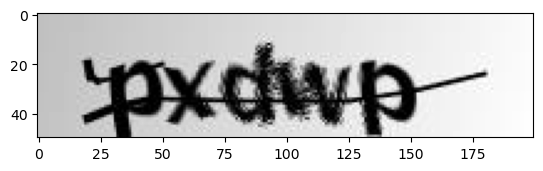

Actual Captcha: pxdwp
1/1 [==============================] - 0s 20ms/step
Predicted Captcha = pxdbp




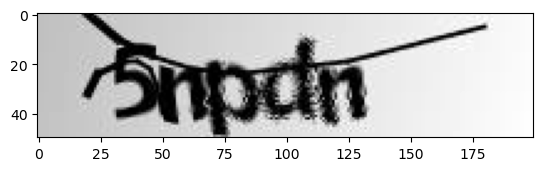

Actual Captcha: 5npdn
1/1 [==============================] - 0s 20ms/step
Predicted Captcha = 5npdn




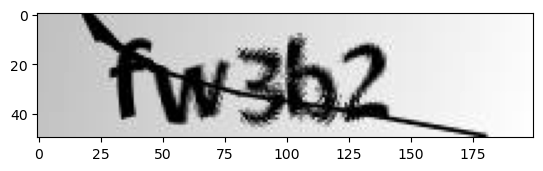

Actual Captcha: fw3b2
1/1 [==============================] - 0s 20ms/step
Predicted Captcha = fw3b2




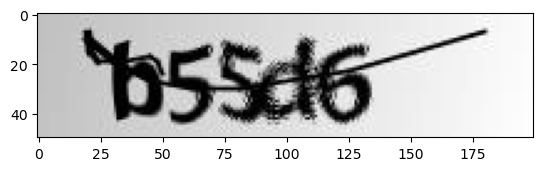

Actual Captcha: b55d6
1/1 [==============================] - 0s 21ms/step
Predicted Captcha = b55d6




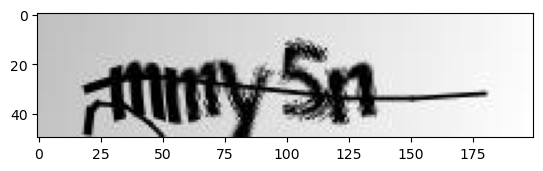

Actual Captcha: mmy5n
1/1 [==============================] - 0s 21ms/step
Predicted Captcha = mmy5n




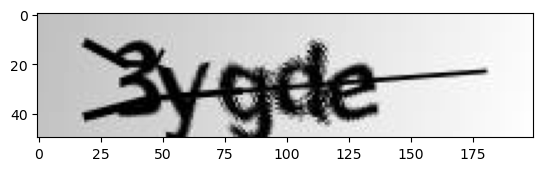

Actual Captcha: 3ygde
1/1 [==============================] - 0s 21ms/step
Predicted Captcha = 3ygde




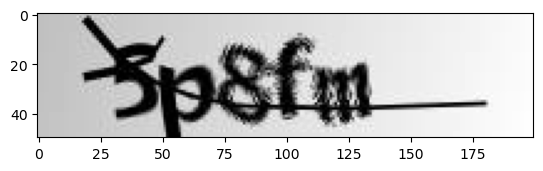

Actual Captcha: 5p8fm
1/1 [==============================] - 0s 20ms/step
Predicted Captcha = 5p8fm




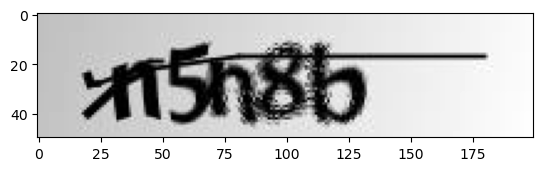

Actual Captcha: n5n8b
1/1 [==============================] - 0s 22ms/step
Predicted Captcha = n5n4n




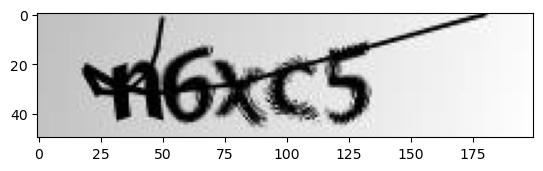

Actual Captcha: n6xc5
1/1 [==============================] - 0s 19ms/step
Predicted Captcha = n6xc5




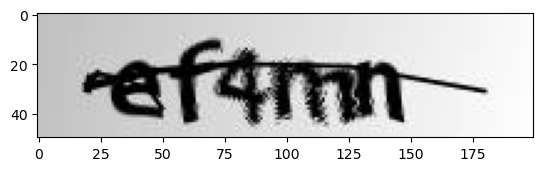

Actual Captcha: ef4mn
1/1 [==============================] - 0s 21ms/step
Predicted Captcha = ef4nm




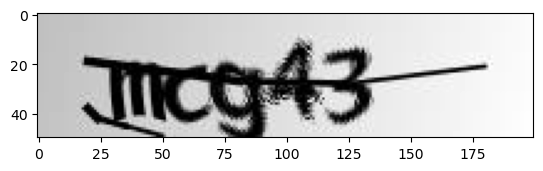

Actual Captcha: mcg43
1/1 [==============================] - 0s 18ms/step
Predicted Captcha = mcg43




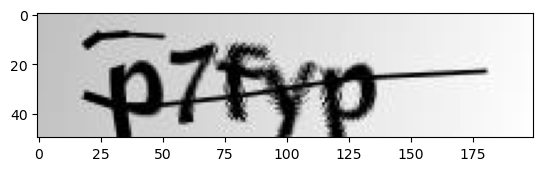

Actual Captcha: p7fyp
1/1 [==============================] - 0s 17ms/step
Predicted Captcha = p7fyp




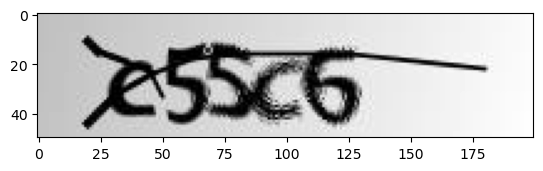

Actual Captcha: c55c6
1/1 [==============================] - 0s 20ms/step
Predicted Captcha = c55f6




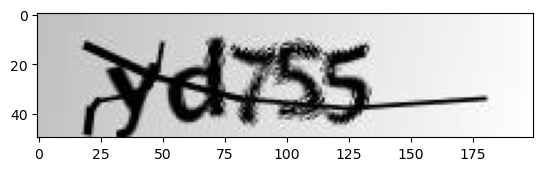

Actual Captcha: yd755
1/1 [==============================] - 0s 20ms/step
Predicted Captcha = yd755




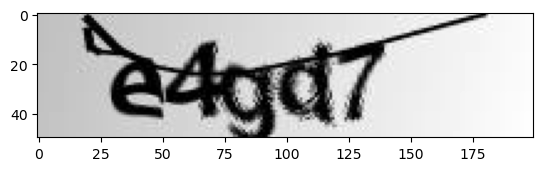

Actual Captcha: e4gd7
1/1 [==============================] - 0s 18ms/step
Predicted Captcha = e4gd7




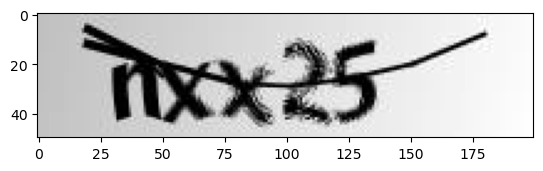

Actual Captcha: nxx25
1/1 [==============================] - 0s 19ms/step
Predicted Captcha = nxx25




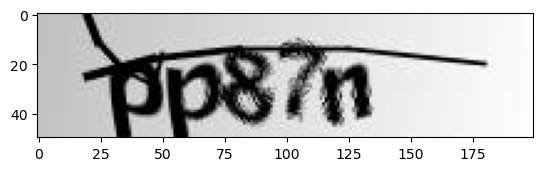

Actual Captcha: pp87n
1/1 [==============================] - 0s 20ms/step
Predicted Captcha = pp87n




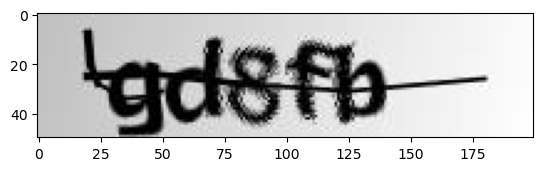

Actual Captcha: gd8fb
1/1 [==============================] - 0s 19ms/step
Predicted Captcha = gde5b




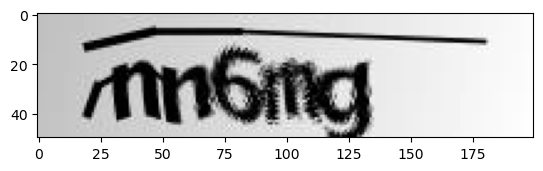

Actual Captcha: nn6mg
1/1 [==============================] - 0s 20ms/step
Predicted Captcha = nn6eg




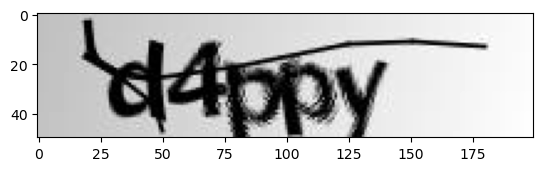

Actual Captcha: d4ppy
1/1 [==============================] - 0s 19ms/step
Predicted Captcha = d4ppy




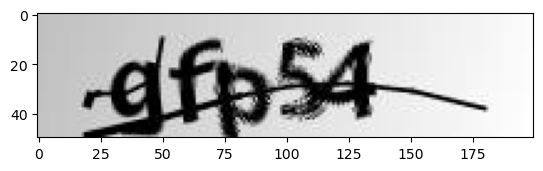

Actual Captcha: gfp54
1/1 [==============================] - 0s 20ms/step
Predicted Captcha = gfp54




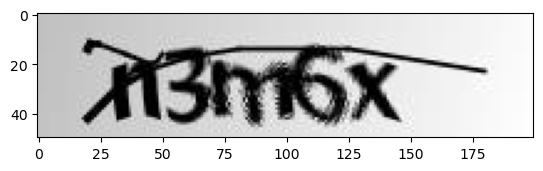

Actual Captcha: n3m6x
1/1 [==============================] - 0s 19ms/step
Predicted Captcha = n3m6b




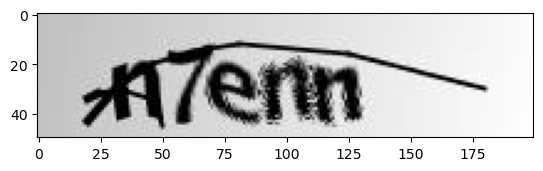

Actual Captcha: n7enn
1/1 [==============================] - 0s 20ms/step
Predicted Captcha = n7enn




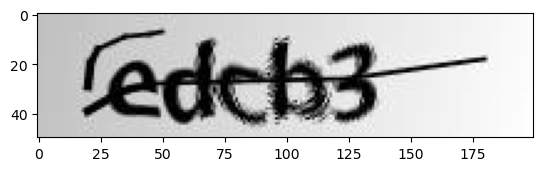

Actual Captcha: cdcb3
1/1 [==============================] - 0s 19ms/step
Predicted Captcha = edcb3




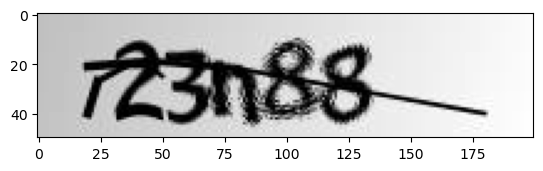

Actual Captcha: 23n88
1/1 [==============================] - 0s 18ms/step
Predicted Captcha = 23n88




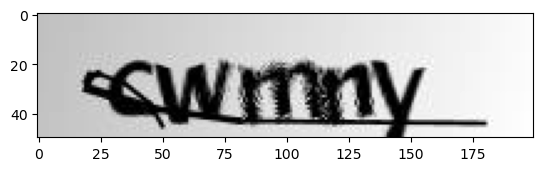

Actual Captcha: cwmny
1/1 [==============================] - 0s 18ms/step
Predicted Captcha = cwnnn




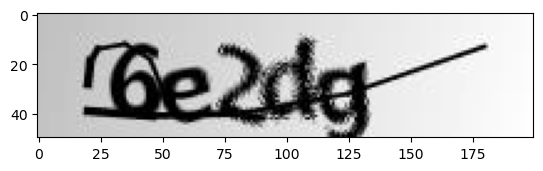

Actual Captcha: 6e2dg
1/1 [==============================] - 0s 19ms/step
Predicted Captcha = 6e2dg




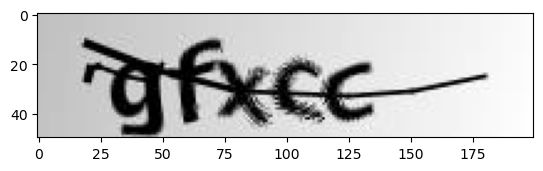

Actual Captcha: gfxcc
1/1 [==============================] - 0s 19ms/step
Predicted Captcha = gfxcc




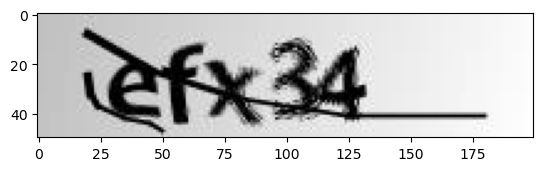

Actual Captcha: efx34
1/1 [==============================] - 0s 20ms/step
Predicted Captcha = efx34




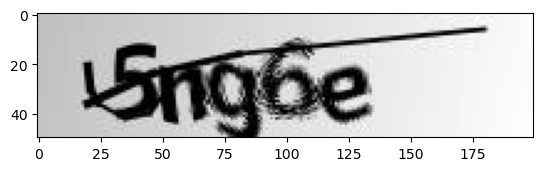

Actual Captcha: 5ng6e
1/1 [==============================] - 0s 20ms/step
Predicted Captcha = 5ng5e




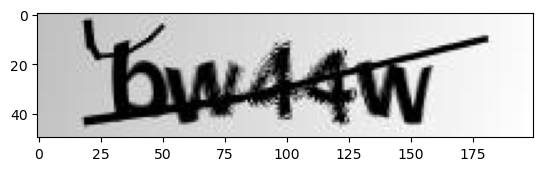

Actual Captcha: bw44w
1/1 [==============================] - 0s 20ms/step
Predicted Captcha = bw4en




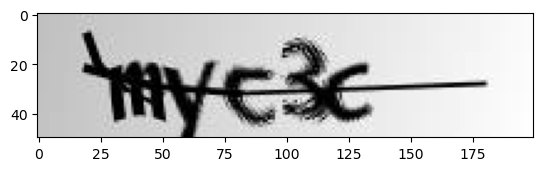

Actual Captcha: myc3c
1/1 [==============================] - 0s 20ms/step
Predicted Captcha = myc3c




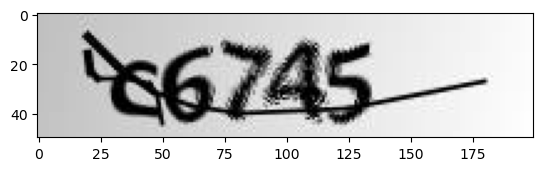

Actual Captcha: c6745
1/1 [==============================] - 0s 20ms/step
Predicted Captcha = c6745




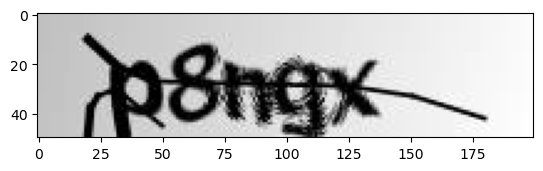

Actual Captcha: p8ngx
1/1 [==============================] - 0s 19ms/step
Predicted Captcha = p8ngx




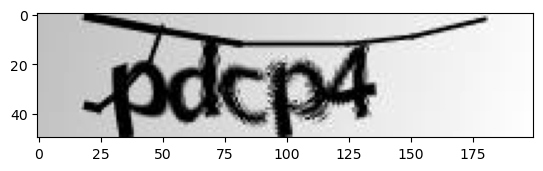

Actual Captcha: pdcp4
1/1 [==============================] - 0s 21ms/step
Predicted Captcha = pdcp4




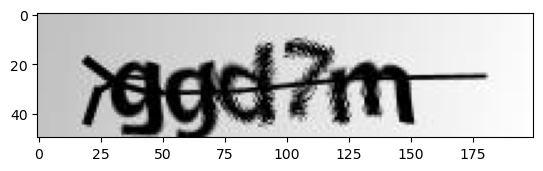

Actual Captcha: ggd7m
1/1 [==============================] - 0s 20ms/step
Predicted Captcha = ggd7n




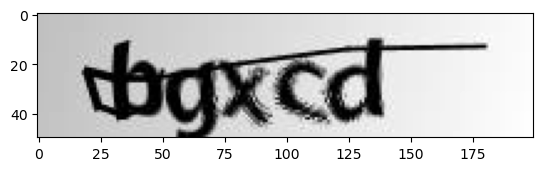

Actual Captcha: bgxcd
1/1 [==============================] - 0s 19ms/step
Predicted Captcha = bgxcd




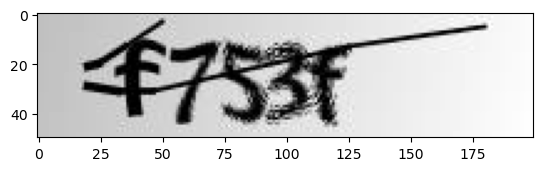

Actual Captcha: f753f
1/1 [==============================] - 0s 19ms/step
Predicted Captcha = f753f




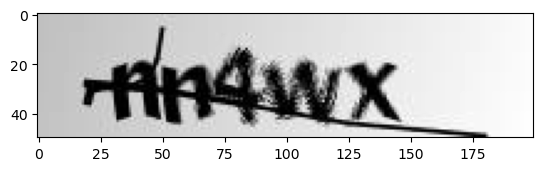

Actual Captcha: nn4wx
1/1 [==============================] - 0s 19ms/step
Predicted Captcha = nn4wx




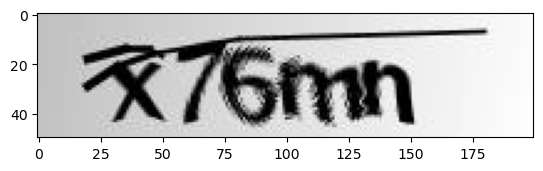

Actual Captcha: x76mn
1/1 [==============================] - 0s 19ms/step
Predicted Captcha = x76mm




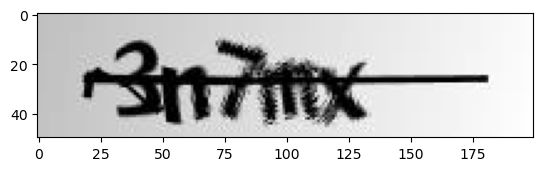

Actual Captcha: 3n7mx
1/1 [==============================] - 0s 20ms/step
Predicted Captcha = 3n7mx




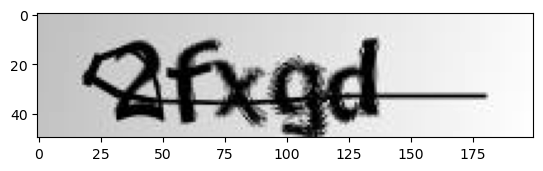

Actual Captcha: 2fxgd
1/1 [==============================] - 0s 19ms/step
Predicted Captcha = 2fxgd




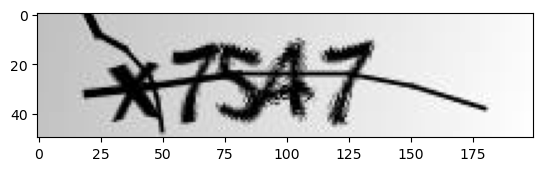

Actual Captcha: x7547
1/1 [==============================] - 0s 30ms/step
Predicted Captcha = x7547




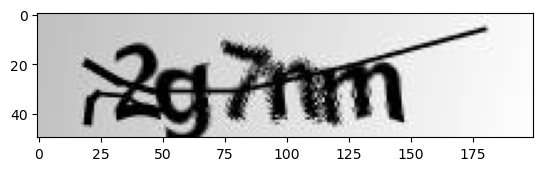

Actual Captcha: 2g7nm
1/1 [==============================] - 0s 21ms/step
Predicted Captcha = 2g7nm




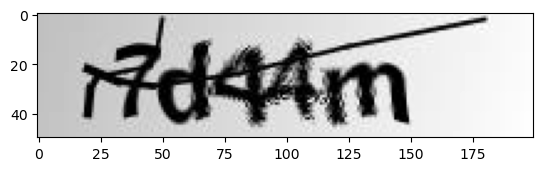

Actual Captcha: 7d44m
1/1 [==============================] - 0s 22ms/step
Predicted Captcha = 7d44n




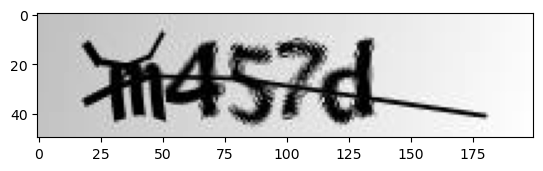

Actual Captcha: m457d
1/1 [==============================] - 0s 22ms/step
Predicted Captcha = m457d




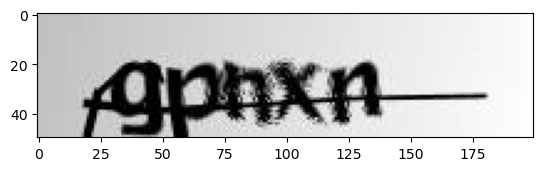

Actual Captcha: gpnxn
1/1 [==============================] - 0s 23ms/step
Predicted Captcha = gpnxn




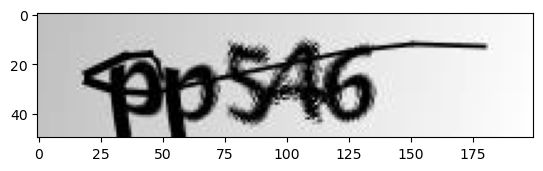

Actual Captcha: pp546
1/1 [==============================] - 0s 23ms/step
Predicted Captcha = pp546




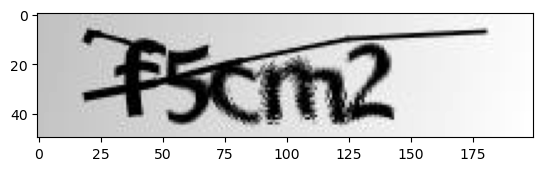

Actual Captcha: f5cm2
1/1 [==============================] - 0s 20ms/step
Predicted Captcha = f5cm2




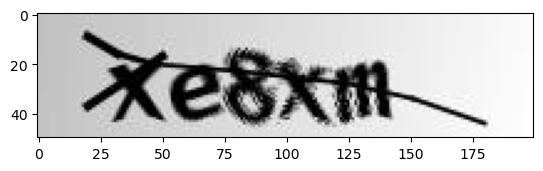

Actual Captcha: xe8xm
1/1 [==============================] - 0s 22ms/step
Predicted Captcha = xe8xm




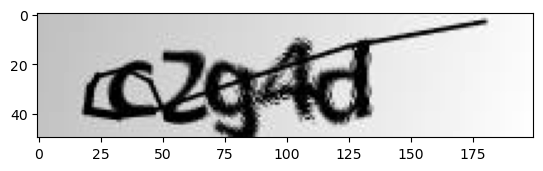

Actual Captcha: c2g4d
1/1 [==============================] - 0s 20ms/step
Predicted Captcha = c2g4d




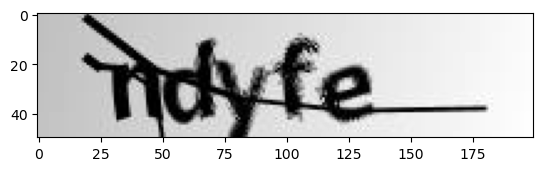

Actual Captcha: ndyfe
1/1 [==============================] - 0s 19ms/step
Predicted Captcha = ndyfe




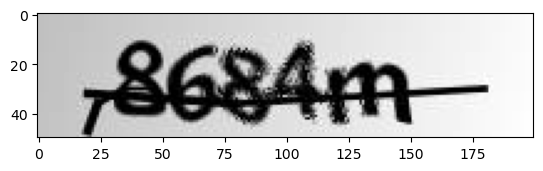

Actual Captcha: 8684m
1/1 [==============================] - 0s 22ms/step
Predicted Captcha = 8684n




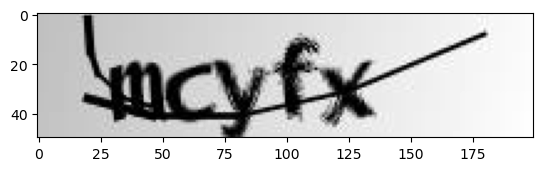

Actual Captcha: mcyfx
1/1 [==============================] - 0s 21ms/step
Predicted Captcha = mcyfx




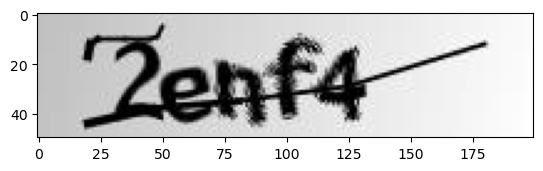

Actual Captcha: 2enf4
1/1 [==============================] - 0s 21ms/step
Predicted Captcha = 2cnf4




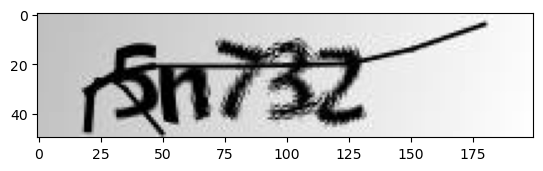

Actual Captcha: 5n732
1/1 [==============================] - 0s 19ms/step
Predicted Captcha = 5n732




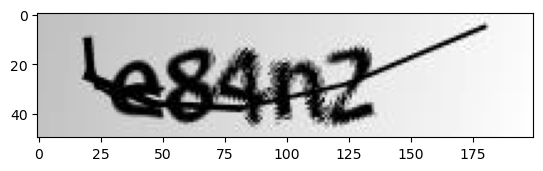

Actual Captcha: e84n2
1/1 [==============================] - 0s 20ms/step
Predicted Captcha = e84n2




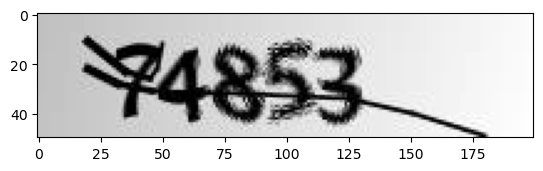

Actual Captcha: 74853
1/1 [==============================] - 0s 23ms/step
Predicted Captcha = 74853




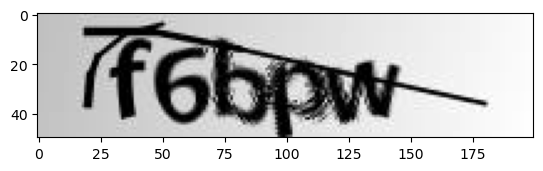

Actual Captcha: f6bpw
1/1 [==============================] - 0s 20ms/step
Predicted Captcha = f6bpw




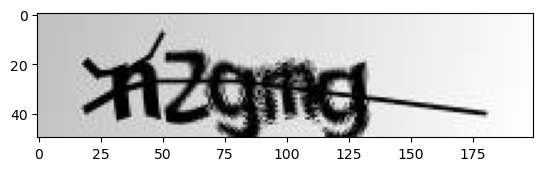

Actual Captcha: n2gmg
1/1 [==============================] - 0s 23ms/step
Predicted Captcha = n2gmg




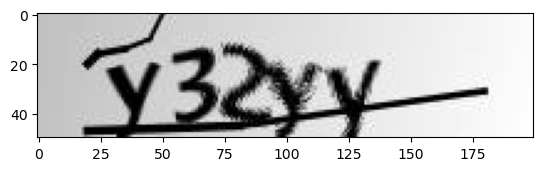

Actual Captcha: y32yy
1/1 [==============================] - 0s 20ms/step
Predicted Captcha = y32yy




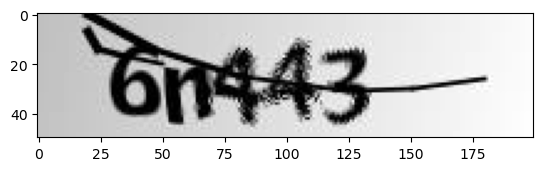

Actual Captcha: 6n443
1/1 [==============================] - 0s 21ms/step
Predicted Captcha = 6n443




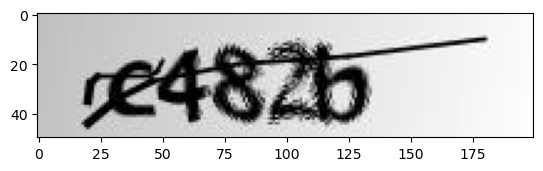

Actual Captcha: c482b
1/1 [==============================] - 0s 21ms/step
Predicted Captcha = c482b




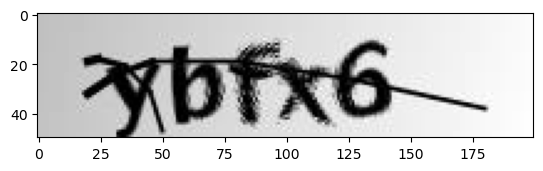

Actual Captcha: ybfx6
1/1 [==============================] - 0s 21ms/step
Predicted Captcha = ybfx8




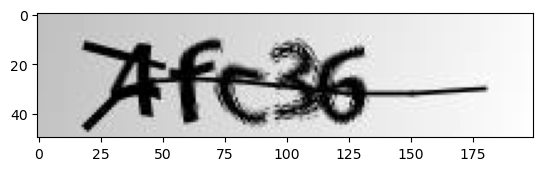

Actual Captcha: 4fc36
1/1 [==============================] - 0s 19ms/step
Predicted Captcha = 4fc36




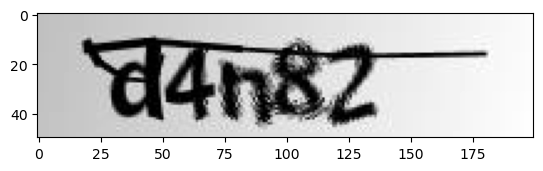

Actual Captcha: d4n82
1/1 [==============================] - 0s 23ms/step
Predicted Captcha = d4n82




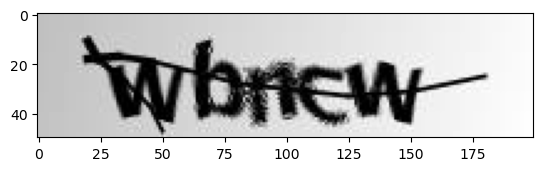

Actual Captcha: wbncw
1/1 [==============================] - 0s 20ms/step
Predicted Captcha = wd4cw




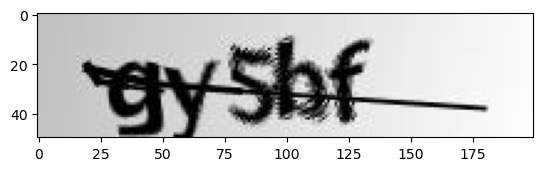

Actual Captcha: gy5bf
1/1 [==============================] - 0s 20ms/step
Predicted Captcha = gy5bf




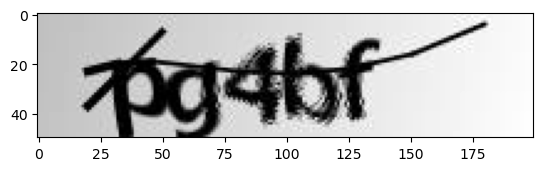

Actual Captcha: pg4bf
1/1 [==============================] - 0s 19ms/step
Predicted Captcha = pg4bf




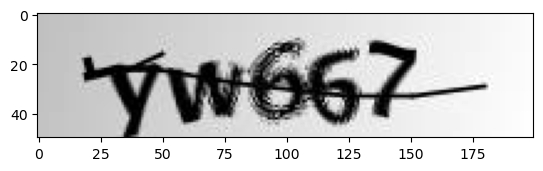

Actual Captcha: yw667
1/1 [==============================] - 0s 20ms/step
Predicted Captcha = ywn68




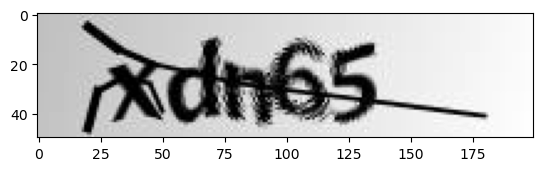

Actual Captcha: xdn65
1/1 [==============================] - 0s 18ms/step
Predicted Captcha = xdn65




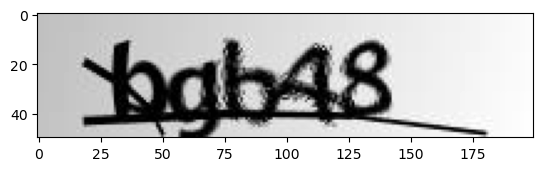

Actual Captcha: bgb48
1/1 [==============================] - 0s 20ms/step
Predicted Captcha = bgb48




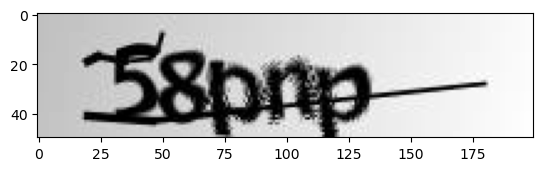

Actual Captcha: 58pnp
1/1 [==============================] - 0s 21ms/step
Predicted Captcha = 58pnp




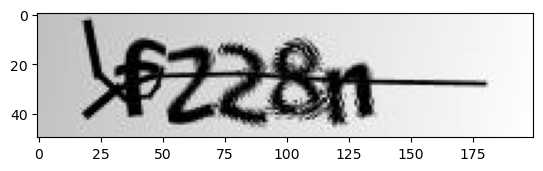

Actual Captcha: f228n
1/1 [==============================] - 0s 19ms/step
Predicted Captcha = f228n




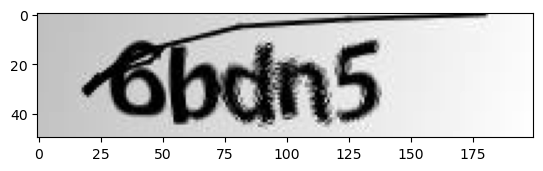

Actual Captcha: 6bdn5
1/1 [==============================] - 0s 20ms/step
Predicted Captcha = 6bdn5




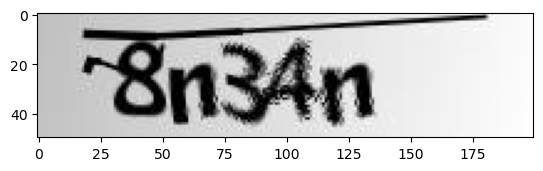

Actual Captcha: 8n34n
1/1 [==============================] - 0s 20ms/step
Predicted Captcha = 8n34n




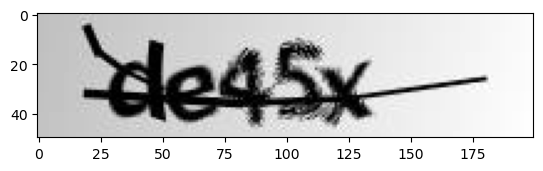

Actual Captcha: de45x
1/1 [==============================] - 0s 23ms/step
Predicted Captcha = de45x




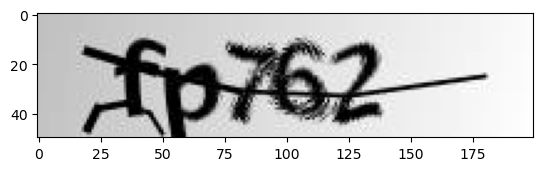

Actual Captcha: fp762
1/1 [==============================] - 0s 20ms/step
Predicted Captcha = fp762




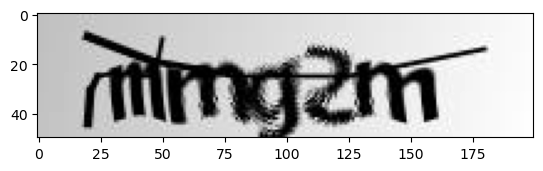

Actual Captcha: mmg2m
1/1 [==============================] - 0s 20ms/step
Predicted Captcha = mmxpe




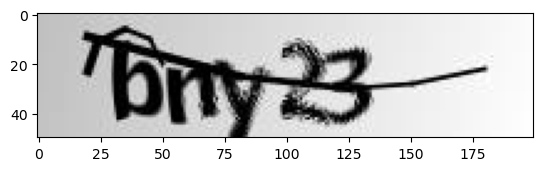

Actual Captcha: bny23
1/1 [==============================] - 0s 20ms/step
Predicted Captcha = bny23




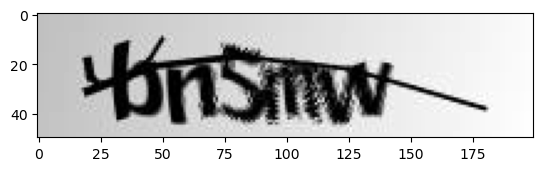

Actual Captcha: bn5mw
1/1 [==============================] - 0s 21ms/step
Predicted Captcha = bn5mw




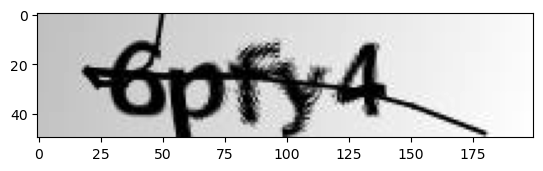

Actual Captcha: 6pfy4
1/1 [==============================] - 0s 18ms/step
Predicted Captcha = 6pfy4




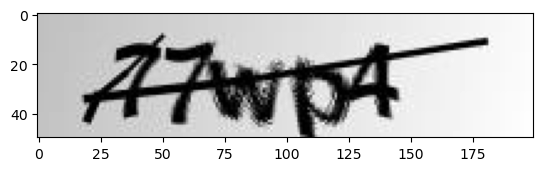

Actual Captcha: 77wp4
1/1 [==============================] - 0s 19ms/step
Predicted Captcha = 77wp4




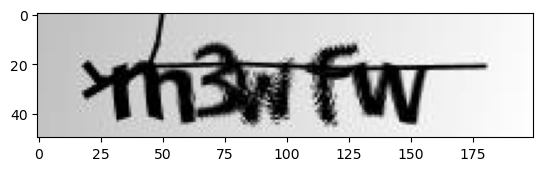

Actual Captcha: m3wfw
1/1 [==============================] - 0s 21ms/step
Predicted Captcha = m7wnw




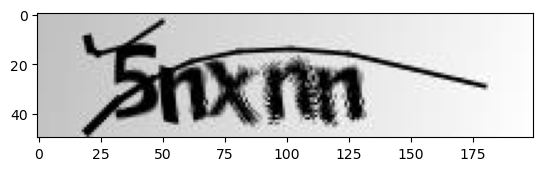

Actual Captcha: 5nxnn
1/1 [==============================] - 0s 19ms/step
Predicted Captcha = 5nxnn




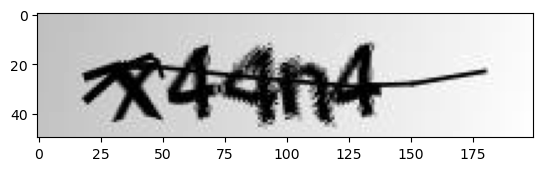

Actual Captcha: x44n4
1/1 [==============================] - 0s 20ms/step
Predicted Captcha = x44n4




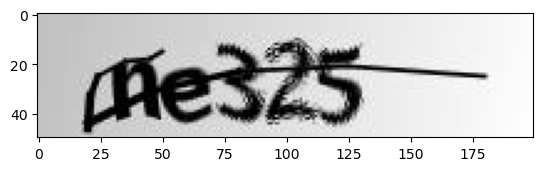

Actual Captcha: ne325
1/1 [==============================] - 0s 20ms/step
Predicted Captcha = ne325




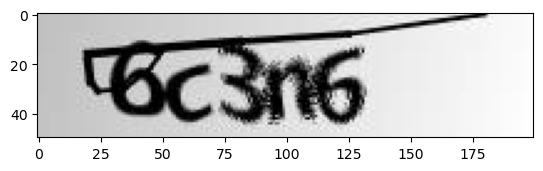

Actual Captcha: 6c3n6
1/1 [==============================] - 0s 20ms/step
Predicted Captcha = 6c3n6




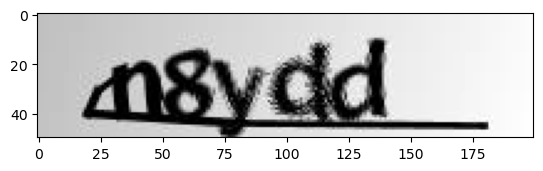

Actual Captcha: n8ydd
1/1 [==============================] - 0s 21ms/step
Predicted Captcha = n8ydd




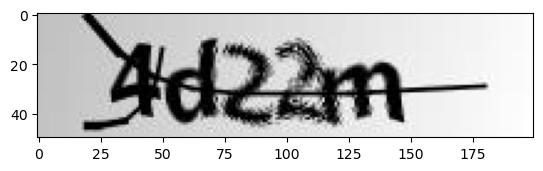

Actual Captcha: 4d22m
1/1 [==============================] - 0s 26ms/step
Predicted Captcha = 4d22m




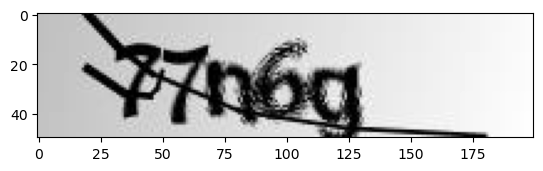

Actual Captcha: 77n6g
1/1 [==============================] - 0s 18ms/step
Predicted Captcha = 77m6n




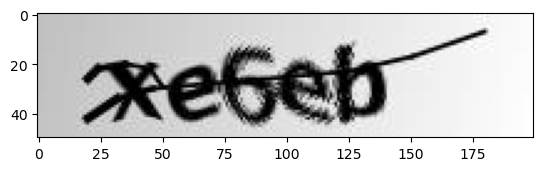

Actual Captcha: xe6eb
1/1 [==============================] - 0s 17ms/step
Predicted Captcha = xe6ep




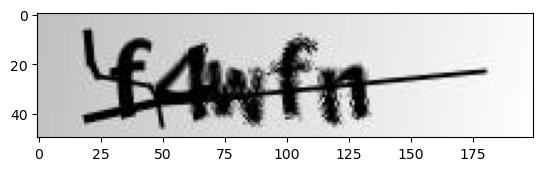

Actual Captcha: f4wfn
1/1 [==============================] - 0s 23ms/step
Predicted Captcha = f4wfn




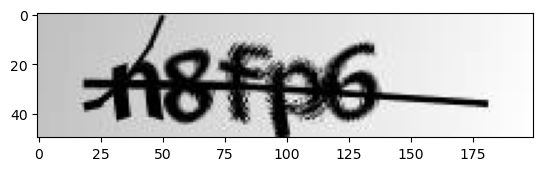

Actual Captcha: n8fp6
1/1 [==============================] - 0s 20ms/step
Predicted Captcha = n8fp6




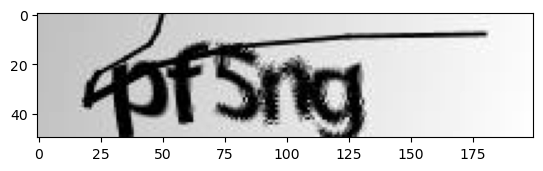

Actual Captcha: pf5ng
1/1 [==============================] - 0s 19ms/step
Predicted Captcha = pf5ng




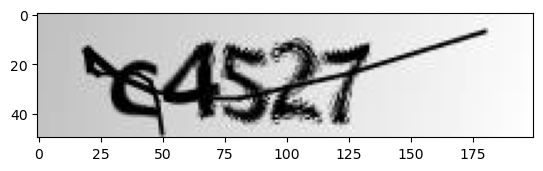

Actual Captcha: c4527
1/1 [==============================] - 0s 18ms/step
Predicted Captcha = c4527




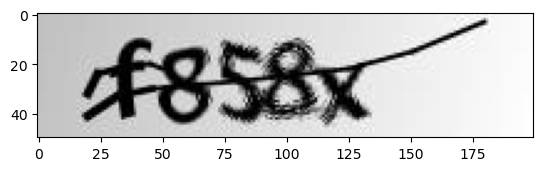

Actual Captcha: f858x
1/1 [==============================] - 0s 20ms/step
Predicted Captcha = f358x




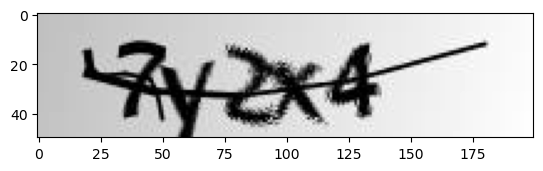

Actual Captcha: 7y2x4
1/1 [==============================] - 0s 18ms/step
Predicted Captcha = 7y2x4




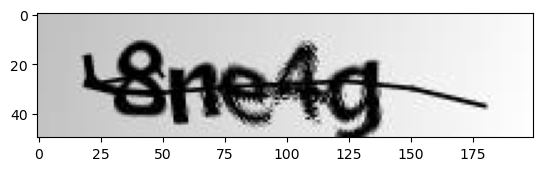

Actual Captcha: 8ne4g
1/1 [==============================] - 0s 21ms/step
Predicted Captcha = 8ne4g




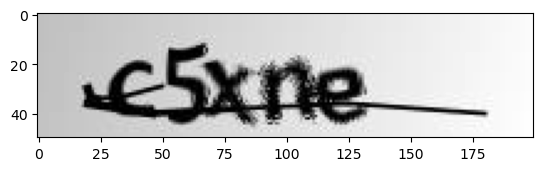

Actual Captcha: c5xne
1/1 [==============================] - 0s 20ms/step
Predicted Captcha = c5cne




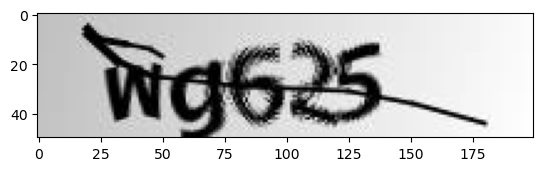

Actual Captcha: wg625
1/1 [==============================] - 0s 22ms/step
Predicted Captcha = wg625




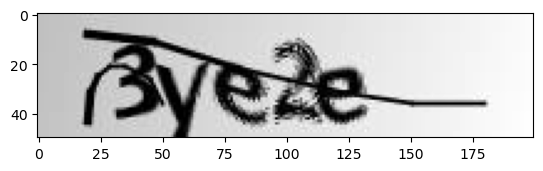

Actual Captcha: 3ye2e
1/1 [==============================] - 0s 24ms/step
Predicted Captcha = 3ye2e




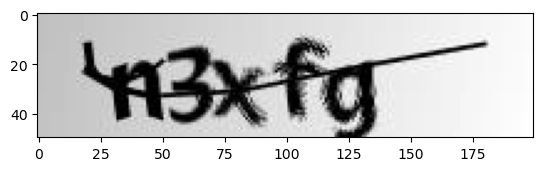

Actual Captcha: n3xfg
1/1 [==============================] - 0s 23ms/step
Predicted Captcha = n3xfg




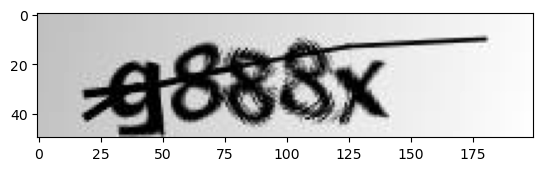

Actual Captcha: g888x
1/1 [==============================] - 0s 22ms/step
Predicted Captcha = g8b8x




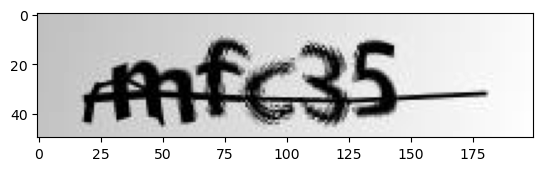

Actual Captcha: mfc35
1/1 [==============================] - 0s 27ms/step
Predicted Captcha = m7m25




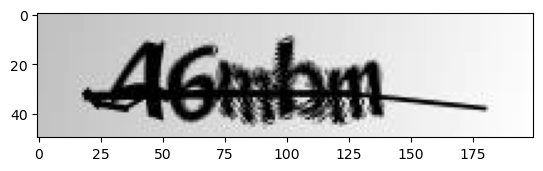

Actual Captcha: 46mbm
1/1 [==============================] - 0s 24ms/step
Predicted Captcha = 46nbm




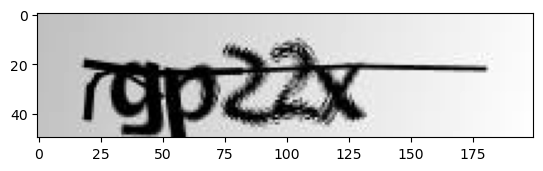

Actual Captcha: gp22x
1/1 [==============================] - 0s 23ms/step
Predicted Captcha = gp22x




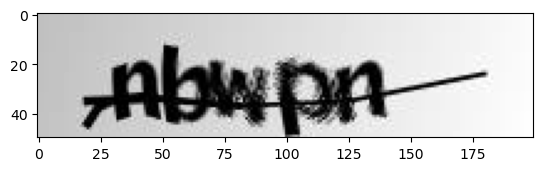

Actual Captcha: nbwpn
1/1 [==============================] - 0s 22ms/step
Predicted Captcha = nbwpn




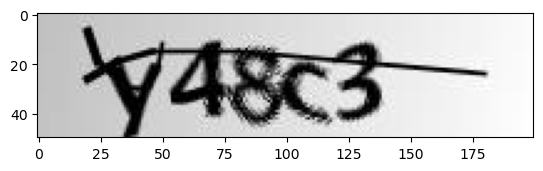

Actual Captcha: y48c3
1/1 [==============================] - 0s 22ms/step
Predicted Captcha = y48x3




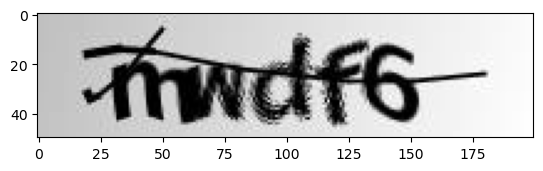

Actual Captcha: mwdf6
1/1 [==============================] - 0s 22ms/step
Predicted Captcha = nwnd6




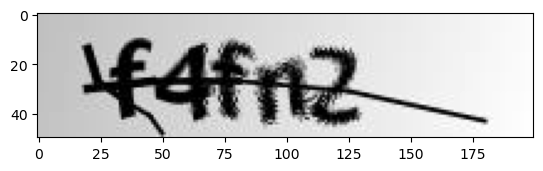

Actual Captcha: f4fn2
1/1 [==============================] - 0s 20ms/step
Predicted Captcha = f4fn2




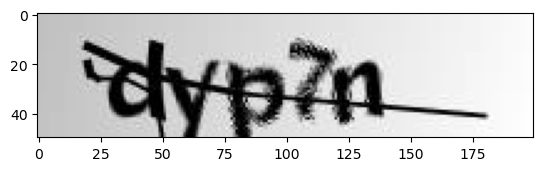

Actual Captcha: dyp7n
1/1 [==============================] - 0s 22ms/step
Predicted Captcha = dyp7n




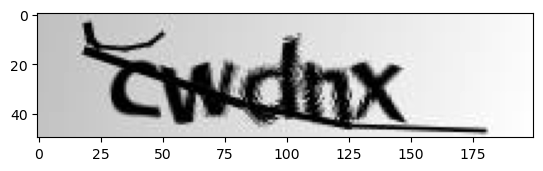

Actual Captcha: cwdnx
1/1 [==============================] - 0s 24ms/step
Predicted Captcha = cwxnx




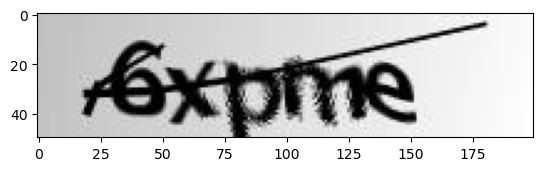

Actual Captcha: 6xpme
1/1 [==============================] - 0s 21ms/step
Predicted Captcha = 6xpmn




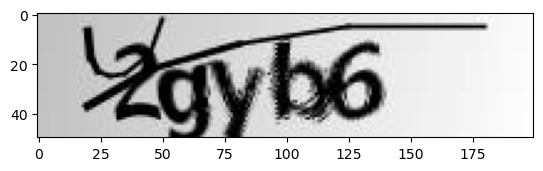

Actual Captcha: 2gyb6
1/1 [==============================] - 0s 21ms/step
Predicted Captcha = 2gyb6




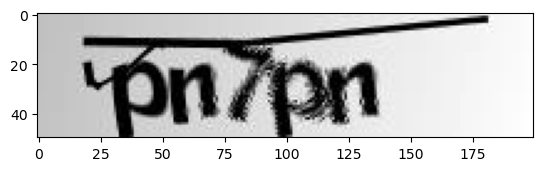

Actual Captcha: pn7pn
1/1 [==============================] - 0s 21ms/step
Predicted Captcha = pn7pn




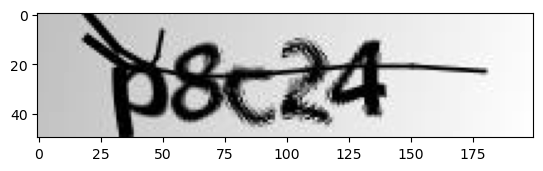

Actual Captcha: p8c24
1/1 [==============================] - 0s 22ms/step
Predicted Captcha = p2c24




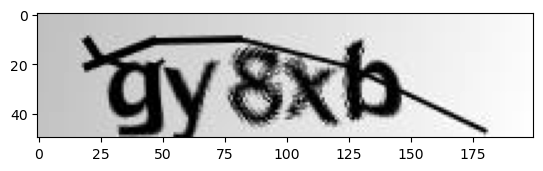

Actual Captcha: gy8xb
1/1 [==============================] - 0s 22ms/step
Predicted Captcha = gyexp




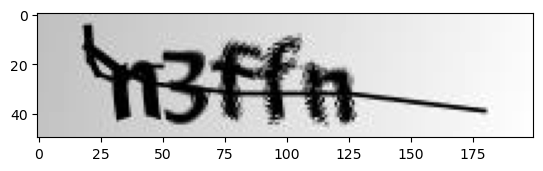

Actual Captcha: n3ffn
1/1 [==============================] - 0s 21ms/step
Predicted Captcha = n3fbf




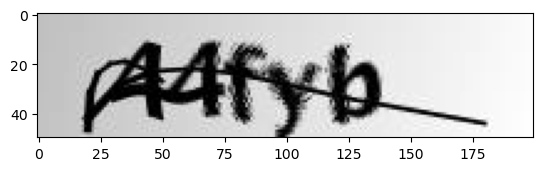

Actual Captcha: 44fyb
1/1 [==============================] - 0s 19ms/step
Predicted Captcha = 44fyb




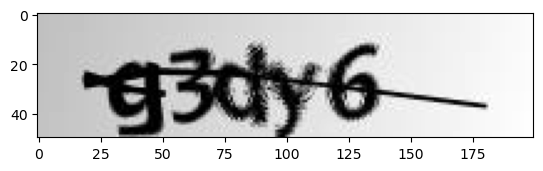

Actual Captcha: g3dy6
1/1 [==============================] - 0s 21ms/step
Predicted Captcha = g3dy6




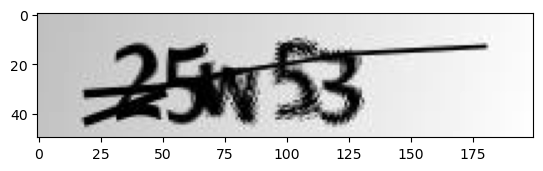

Actual Captcha: 25w53
1/1 [==============================] - 0s 22ms/step
Predicted Captcha = 25w53




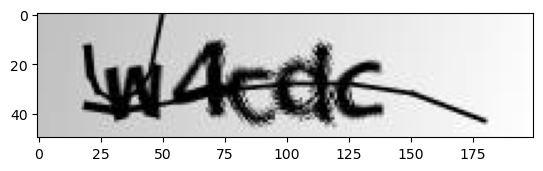

Actual Captcha: w4cdc
1/1 [==============================] - 0s 20ms/step
Predicted Captcha = w4cdc




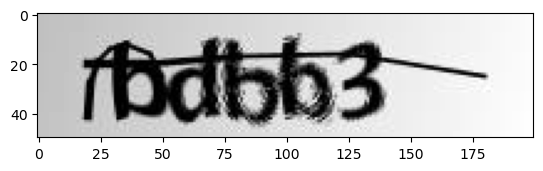

Actual Captcha: bdbb3
1/1 [==============================] - 0s 19ms/step
Predicted Captcha = bdbb3




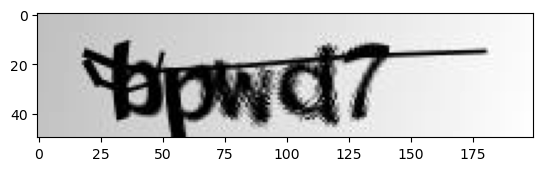

Actual Captcha: bpwd7
1/1 [==============================] - 0s 23ms/step
Predicted Captcha = bpwd7




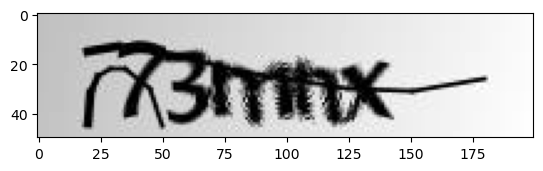

Actual Captcha: 73mnx
1/1 [==============================] - 0s 19ms/step
Predicted Captcha = 73mnx




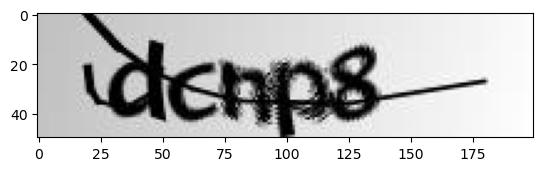

Actual Captcha: dcnp8
1/1 [==============================] - 0s 21ms/step
Predicted Captcha = dcnp8




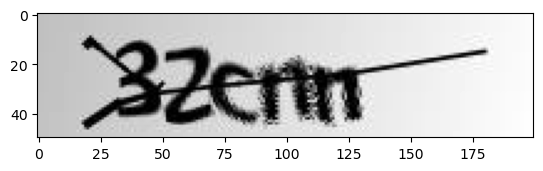

Actual Captcha: 32cnn
1/1 [==============================] - 0s 21ms/step
Predicted Captcha = 32enn




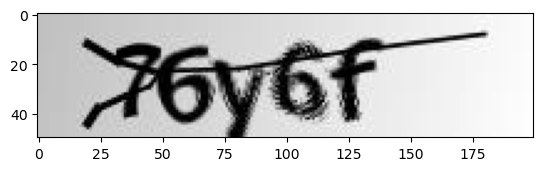

Actual Captcha: 76y6f
1/1 [==============================] - 0s 19ms/step
Predicted Captcha = 76y6f




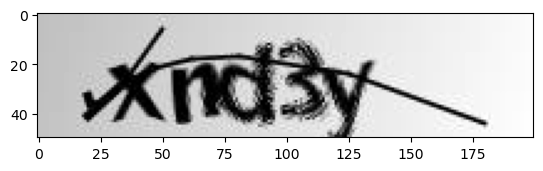

Actual Captcha: xnd3y
1/1 [==============================] - 0s 19ms/step
Predicted Captcha = xnd2y




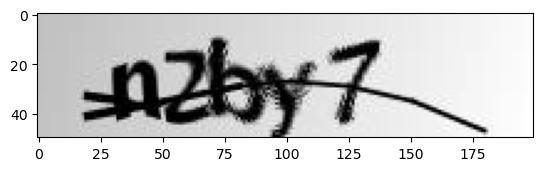

Actual Captcha: n2by7
1/1 [==============================] - 0s 20ms/step
Predicted Captcha = n2by7




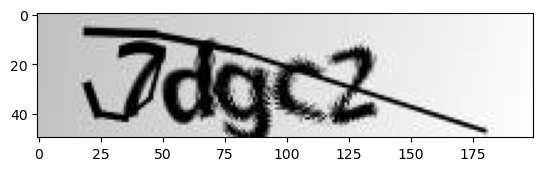

Actual Captcha: 7dgc2
1/1 [==============================] - 0s 20ms/step
Predicted Captcha = 7dgc2




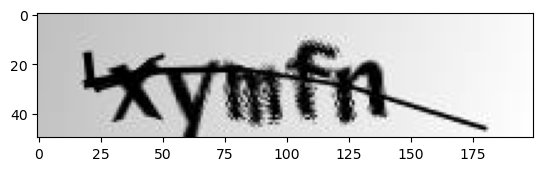

Actual Captcha: xymfn
1/1 [==============================] - 0s 18ms/step
Predicted Captcha = xynfn




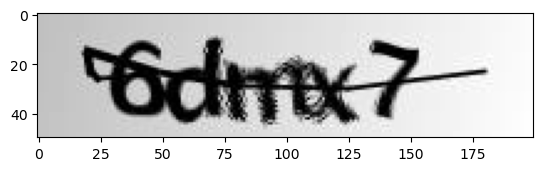

Actual Captcha: 6dmx7
1/1 [==============================] - 0s 21ms/step
Predicted Captcha = 6dmn7




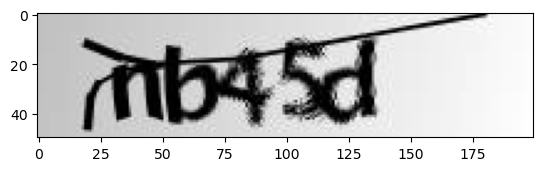

Actual Captcha: nb45d
1/1 [==============================] - 0s 17ms/step
Predicted Captcha = nb45d




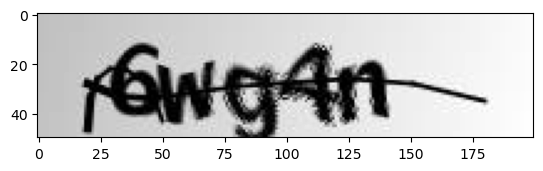

Actual Captcha: 6wg4n
1/1 [==============================] - 0s 20ms/step
Predicted Captcha = 6wg4n




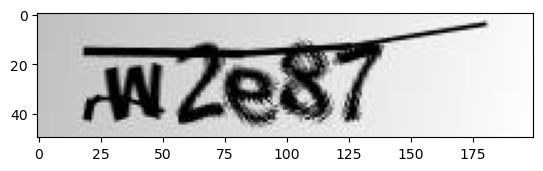

Actual Captcha: w2e87
1/1 [==============================] - 0s 21ms/step
Predicted Captcha = w2e87




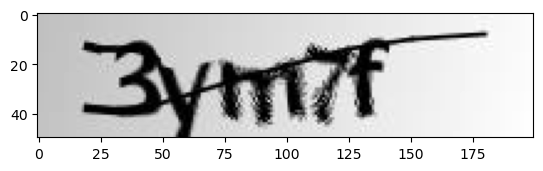

Actual Captcha: 3ym7f
1/1 [==============================] - 0s 20ms/step
Predicted Captcha = 3ym7f




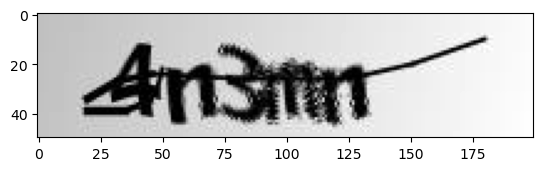

Actual Captcha: 4n3mn
1/1 [==============================] - 0s 20ms/step
Predicted Captcha = 4n3nn




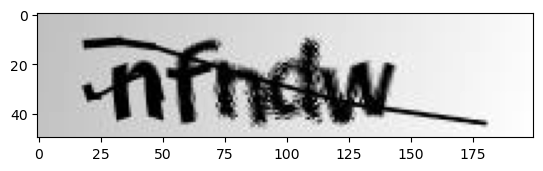

Actual Captcha: nfndw
1/1 [==============================] - 0s 20ms/step
Predicted Captcha = nfndw




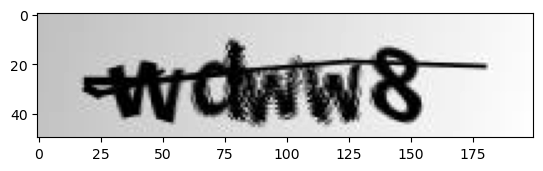

Actual Captcha: wdww8
1/1 [==============================] - 0s 21ms/step
Predicted Captcha = wmwww




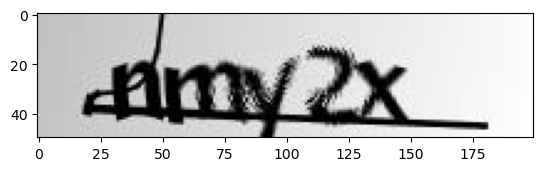

Actual Captcha: nmy2x
1/1 [==============================] - 0s 19ms/step
Predicted Captcha = nmgy2




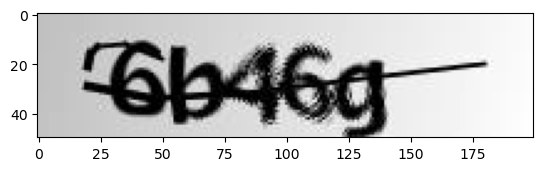

Actual Captcha: 6b46g
1/1 [==============================] - 0s 19ms/step
Predicted Captcha = 6b46g




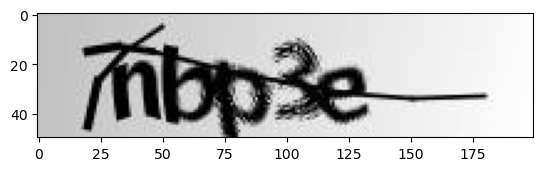

Actual Captcha: nbp3e
1/1 [==============================] - 0s 19ms/step
Predicted Captcha = nbp3e




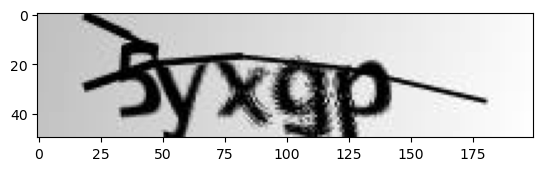

Actual Captcha: 5yxgp
1/1 [==============================] - 0s 23ms/step
Predicted Captcha = 5yxgp




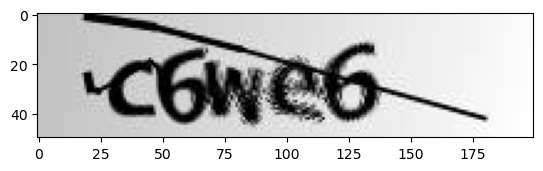

Actual Captcha: c6we6
1/1 [==============================] - 0s 19ms/step
Predicted Captcha = c6we6




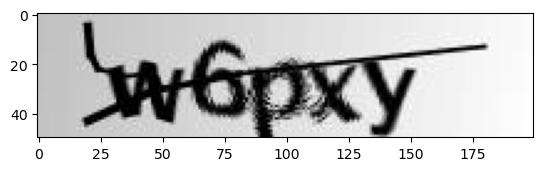

Actual Captcha: w6pxy
1/1 [==============================] - 0s 23ms/step
Predicted Captcha = wdgng




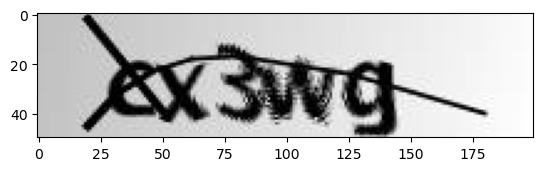

Actual Captcha: cx3wg
1/1 [==============================] - 0s 20ms/step
Predicted Captcha = ex3wg




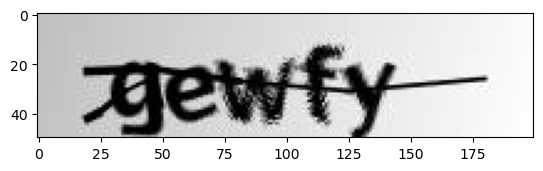

Actual Captcha: gewfy
1/1 [==============================] - 0s 21ms/step
Predicted Captcha = gewdy




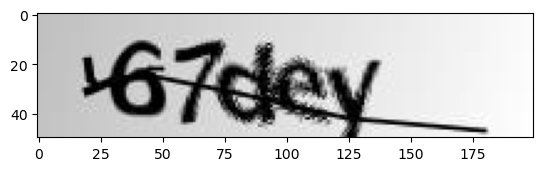

Actual Captcha: 67dey
1/1 [==============================] - 0s 21ms/step
Predicted Captcha = 67dey




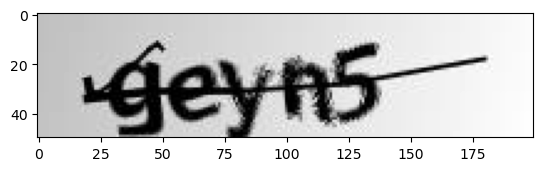

Actual Captcha: geyn5
1/1 [==============================] - 0s 20ms/step
Predicted Captcha = geyn5




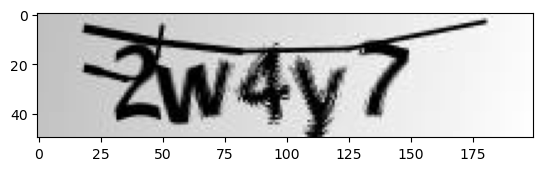

Actual Captcha: 2w4y7
1/1 [==============================] - 0s 19ms/step
Predicted Captcha = 2wxy7




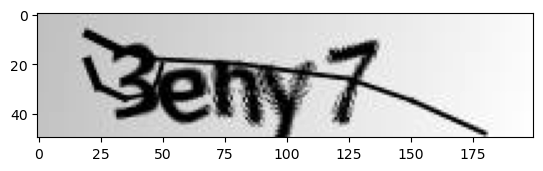

Actual Captcha: 3eny7
1/1 [==============================] - 0s 18ms/step
Predicted Captcha = 3eny7




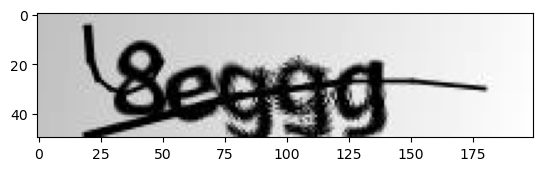

Actual Captcha: 8eggg
1/1 [==============================] - 0s 18ms/step
Predicted Captcha = 8eggg




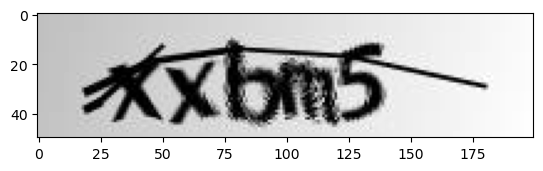

Actual Captcha: xxbm5
1/1 [==============================] - 0s 18ms/step
Predicted Captcha = xxfn5




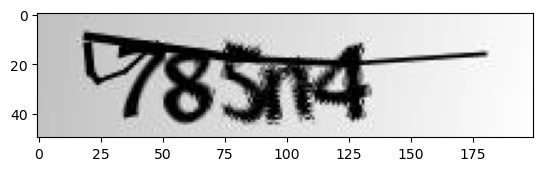

Actual Captcha: 785n4
1/1 [==============================] - 0s 19ms/step
Predicted Captcha = 785n4




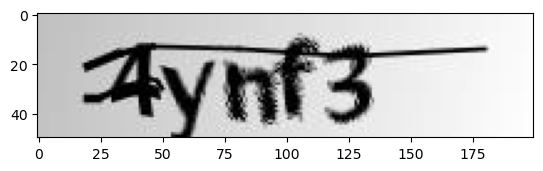

Actual Captcha: 4ynf3
1/1 [==============================] - 0s 18ms/step
Predicted Captcha = 4ynf3




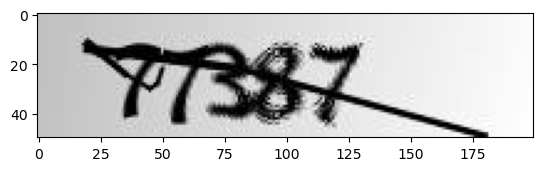

Actual Captcha: 77387
1/1 [==============================] - 0s 21ms/step
Predicted Captcha = 77377




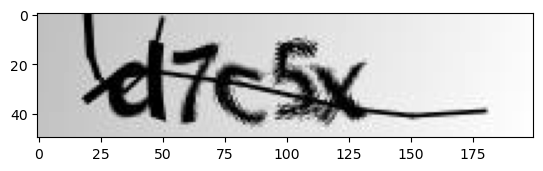

Actual Captcha: d7c5x
1/1 [==============================] - 0s 20ms/step
Predicted Captcha = d7c5x




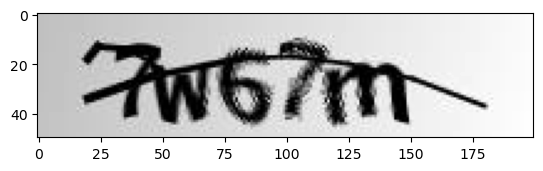

Actual Captcha: 7w67m
1/1 [==============================] - 0s 20ms/step
Predicted Captcha = 7n67n




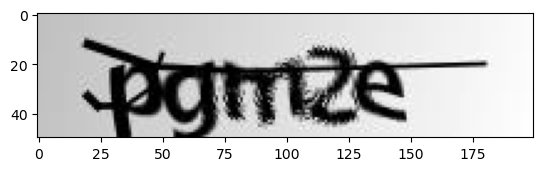

Actual Captcha: pgm2e
1/1 [==============================] - 0s 24ms/step
Predicted Captcha = pgnn2




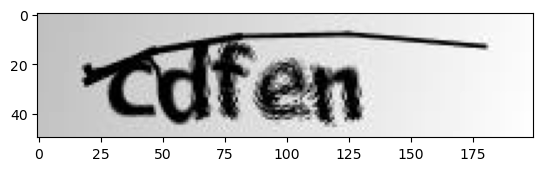

Actual Captcha: cdfen
1/1 [==============================] - 0s 22ms/step
Predicted Captcha = cdfen




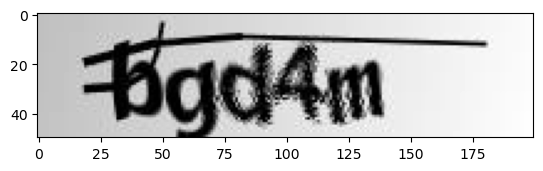

Actual Captcha: bgd4m
1/1 [==============================] - 0s 24ms/step
Predicted Captcha = bgd4m




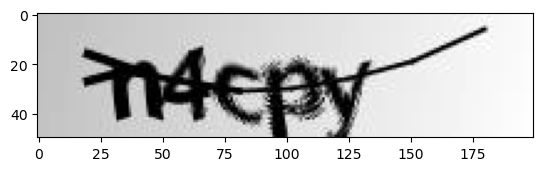

Actual Captcha: n4cpy
1/1 [==============================] - 0s 20ms/step
Predicted Captcha = n4cpy




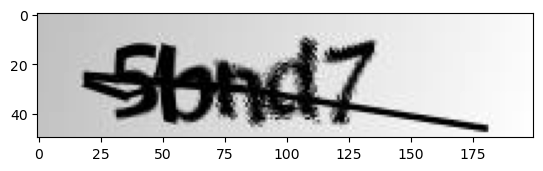

Actual Captcha: 5bnd7
1/1 [==============================] - 0s 20ms/step
Predicted Captcha = 5bnd7




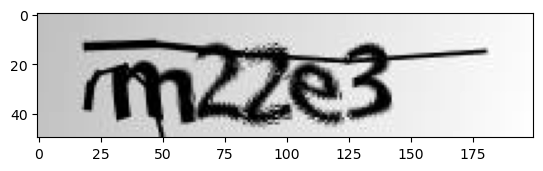

Actual Captcha: m22e3
1/1 [==============================] - 0s 20ms/step
Predicted Captcha = m23b3




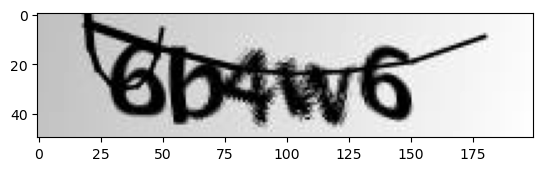

Actual Captcha: 6b4w6
1/1 [==============================] - 0s 24ms/step
Predicted Captcha = 6b4ww




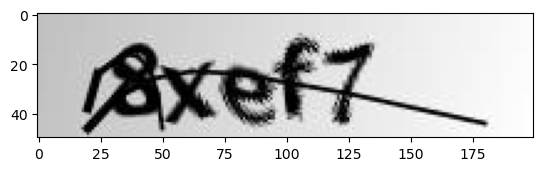

Actual Captcha: 8xef7
1/1 [==============================] - 0s 22ms/step
Predicted Captcha = 8xef7




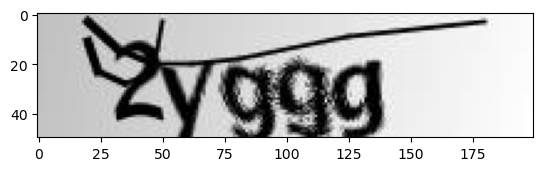

Actual Captcha: 2yggg
1/1 [==============================] - 0s 21ms/step
Predicted Captcha = 2yggg




In [125]:
# displaying the model performance on test images
cnt=0
for i, pic in enumerate(os.listdir("/kaggle/input/captcha-data/data/val")):
    img = cv2.imread(os.path.join("/kaggle/input/captcha-data/data/val", pic), cv2.IMREAD_GRAYSCALE)
    plt.imshow(img, cmap=plt.get_cmap('gray'))
    plt.show()
    print("Actual Captcha:",pic[:-4])
    img_path = "/kaggle/input/captcha-data/data/val/" + str(pic)
    predicted_img =predict(img_path)
    print("Predicted Captcha =",predicted_img)
    print("\n")
    if(predicted_img==pic[:-4]):
        cnt+=1

In [130]:
print("The accuracy of breaking test captchas is:",str((149/214)*100)[0:6],"%")

The accuracy of breaking test captchas is: 69.626 %
